<a href="https://colab.research.google.com/github/descartesmbogning/phage-therapy-patents-analysis/blob/main/4_diseases_classif_patent_analysis_23102023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import data


In [100]:
#!pip install nltk matplotlib wordcloud scikit-learn


In [101]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [102]:
import nltk
import pandas as pd
import numpy as np
#import matplotlib
#matplotlib.use('Agg')
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from collections import Counter
nltk.download('punkt')
import textwrap

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [103]:
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Downloads
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize your stopwords set with wordcloud's stopwords
s = set(STOPWORDS)

# Get stopwords for all languages in NLTK
languages = stopwords.fileids()
for language in languages:
    s.update(stopwords.words(language))

# Add any additional stopwords if needed
s.add('amp')

# If you really need the resulting stopwords as a list:
stopwords_list = list(s)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [104]:
# Load your dataset (Assuming it's a CSV with a column 'abstract' for patent abstracts)

In [105]:
import pandas as pd
import glob

folder_path = '/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/'  # Modify with your path
common_name = 'data_patent_therapy_and_diseases_Microorganisms_Taxon_chunk_23102023*'  # Modify with the common part of the filename

# List all files that have the common part in their names
all_files = glob.glob(folder_path + common_name + ".csv*")

# Empty list to store dataframes
dfs = []

for filename in all_files:
    # Read each csv file into a dataframe
    df = pd.read_csv(filename)
    dfs.append(df)

# Concatenate all dataframes into a single dataframe
Diseases_data = pd.concat(dfs, ignore_index=True)

# If you want to save the merged dataframe to a new Excel file:
Diseases_data.to_csv(folder_path + "data_patent_therapy_diseases_Microorganisms_Taxon_chunk_merged_data_20102023.csv", index=False)
Diseases_data['Application Year'] = pd.to_datetime(Diseases_data['Application Date']).dt.year
Diseases_data['Application Year'] = Diseases_data['Application Year'].astype('Int64')
pd.set_option('display.max_columns', None)
Diseases_data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year
0,1,RU,C2,RU 2214829 C2,069-390-611-717-343,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,4,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD me...,method for tuberculosis phagotherapy field me...,method for tuberculosis phagotherapy field: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,"['phagotherapy', 'toxicity', 'tuberculosis', '...",[],"(mycobacteriophage D29, mycobacteriophage D29,...",2001
1,2,JP,A,JP 2016104011 A,114-759-028-882-736,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,antibacterial phages phage peptides and use m...,"antibacterial phages, phage peptides and use m...","ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...","['bacterial infection', 'bacterial infection',...",[],(),2015
2,3,AU,A1,AU 2015/255318 A1,094-982-928-461-863,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,"Antibacterial phage, phage peptides and method...",Antibacterial phage phage peptides and method...,antibacterial phage phage peptides and method...,"antibacterial phage, phage peptides and method...","ANTIBACTERIAL PHAGE, PHAGE PEPTIDES AND METHOD...",ANTIBACTERIAL PHAGE PHAGE PEPTIDES AND METHOD...,"Antibacterial phage, phage peptides and method...","['bacterial infections', 'bacterial infection'...",['F87s/06'],(),2015
3,4,US,A1,US 2016/0022747 A1,167-908-891-122-112,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL ANGELO;;SOUSA DE SAO JO...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,https://lens.org/167-908-891-122-112,Patent Application,yes,0,1,42,45,816,A61K38/00;;A61K45/06;;C07K14/005;;C12N7/00;;C1...,A61K35/76;;A6

In [106]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
data_topic = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_patent_therapy_23102023_10.pkl').reset_index()[[
    'Lens ID','Topic N°'
]]
pd.set_option('display.max_columns', None)
print(len(data_topic))
data_topic.head()

2309


,Lens ID,Topic N°
0,069-390-611-717-343,2
1,114-759-028-882-736,3
2,094-982-928-461-863,3
3,112-018-476-081-94X,3
4,091-234-230-295-135,3


In [107]:
import pandas as pd

# Assuming `data` is your DataFrame and has a column named 'Jurisdiction'

topics_rename = {
    0: 'Topic 0',
    1: 'Topic 1',
    2: 'Topic 2',
    3: 'Topic 3',
    4: 'Topic 4',
    5: 'Topic 5',
    6: 'Topic 6',
    7: 'Topic 7',
    8: 'Topic 8',
    9: 'Topic 9',
    10: 'Topic 10',
}

# Replace the codes with names in the 'Jurisdiction' column
data_topic['Topic N°'] = data_topic['Topic N°'].map(topics_rename)#.fillna(data_topic['Topic N°'])
data_topic.head()

,Lens ID,Topic N°
0,069-390-611-717-343,Topic 2
1,114-759-028-882-736,Topic 3
2,094-982-928-461-863,Topic 3
3,112-018-476-081-94X,Topic 3
4,091-234-230-295-135,Topic 3


In [108]:
# Merge the DataFrames on 'common_column'
data = Diseases_data.merge(data_topic, on='Lens ID', how='outer')
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,"['bladder cancer', 'cancers', 'tumors', 'bladd...","['human bladder cancer', 'human bladder cancer...","(Escherichia coli, Escherichia coli, escherich...",2000,Topic 7
3,2180,CN,A,CN 103588874 A,000-124-686-529-261,2014-02-19,2014,CN 201310557164 A,2013-11-11,CN 201310557164 A,2013-11-11,Human anti-HBV surface antigen genetic enginee...,The invention discloses a human anti-HBV surfa...,INST VIRAL DISEASE CONTROL & PREVENTION CHINES...,LIANG MIFANG;;BI SHENGLI;;SU

# data preprocessing

In [109]:
data['Application Date'] = pd.to_datetime(data['Application Date'])
data['Earliest Priority Date'] = pd.to_datetime(data['Earliest Priority Date'])

In [110]:
data['Application Year'] = data['Application Date'].dt.year
data['Earliest Priority Year'] = data['Earliest Priority Date'].dt.year

In [111]:
# Convert 'Publication Year' to integers
data['Publication Year'] = data['Publication Year'].astype('Int64')
data['Application Year'] = data['Application Year'].astype('Int64')
data['Earliest Priority Year'] = data['Earliest Priority Year'].astype('Int64')

In [112]:
def group_years_in_ranges(df, col_name):
    bins = list(range(1955, 2026, 5))
    labels = [f"{i}-{i+4}" for i in bins[:-1]]
    return pd.cut(data['Application Year'], bins=bins, labels=labels, right=False)


In [113]:
data['Application_Year_Range'] = group_years_in_ranges(data, 'Application Year')


In [114]:
data['IPCR Classifications']

,IPCR Classifications
0,C07K16/30;;C07K16/00
1,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...
2,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...
3,C07K16/08;;A61K39/42;;A61K48/00;;A61P1/16;;A61...
4,C12N7/00;;A01N63/00;;A23K10/16;;A23K20/195;;A6...
...,...
2361,C07K14/01
2362,A61K9/30;;A61K38/00;;A61K38/46;;C12N9/50
2363,C07K7/06;;A61K9/00;;A61K9/127;;A61K9/14;;A61K4...
2364,C12N7/00;;A01N63/40;;A01P1/00;;A23K10/18;;A23K...


In [115]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_sections(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[0] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Sections'] = data['IPCR Classifications'].apply(process_ipcr_sections)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Sections']]


,IPCR Classifications,IPCR Sections
0,C07K16/30;;C07K16/00,C
1,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,A;;C
2,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,A;;C;;G
3,C07K16/08;;A61K39/42;;A61K48/00;;A61P1/16;;A61...,A;;C;;G
4,C12N7/00;;A01N63/00;;A23K10/16;;A23K20/195;;A6...,A;;C
...,...,...
2361,C07K14/01,C
2362,A61K9/30;;A61K38/00;;A61K38/46;;C12N9/50,A;;C
2363,C07K7/06;;A61K9/00;;A61K9/127;;A61K9/14;;A61K4...,A;;C
2364,C12N7/00;;A01N63/40;;A01P1/00;;A23K10/18;;A23K...,A;;C


In [116]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_class(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:3] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Class'] = data['IPCR Classifications'].apply(process_ipcr_class)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Class']]


,IPCR Classifications,IPCR Class
0,C07K16/30;;C07K16/00,C07
1,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,A61;;C12
2,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,A01;;A61;;C07;;C12;;G01
3,C07K16/08;;A61K39/42;;A61K48/00;;A61P1/16;;A61...,A61;;C07;;C12;;G01
4,C12N7/00;;A01N63/00;;A23K10/16;;A23K20/195;;A6...,A01;;A23;;A61;;C11;;C12
...,...,...
2361,C07K14/01,C07
2362,A61K9/30;;A61K38/00;;A61K38/46;;C12N9/50,A61;;C12
2363,C07K7/06;;A61K9/00;;A61K9/127;;A61K9/14;;A61K4...,A61;;C07
2364,C12N7/00;;A01N63/40;;A01P1/00;;A23K10/18;;A23K...,A01;;A23;;A61;;C12


In [117]:
import pandas as pd

# Define the function to process IPCR codes
def process_ipcr_subclass(ipcr_codes):
    # Check if ipcr_codes is a string (which means it's not NaN or None)
    if isinstance(ipcr_codes, str):
        # Extract the first letter of each code, remove duplicates by converting to a set
        unique_initials = sorted(set(code[:4] for code in ipcr_codes.split(';;') if code))
        # Join the unique initials back together
        return ';;'.join(unique_initials)
    else:
        # If it's not a string, just return an empty string or NaN
        return ''

# Assuming 'data' is your DataFrame
# Apply the function to the 'IPCR Classifications' column
data['IPCR Subclass'] = data['IPCR Classifications'].apply(process_ipcr_subclass)

# Print the DataFrame to verify the results
data[['IPCR Classifications', 'IPCR Subclass']]


,IPCR Classifications,IPCR Subclass
0,C07K16/30;;C07K16/00,C07K
1,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,A61K;;A61P;;C12N
2,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,A01K;;A61K;;A61P;;C07K;;C12N;;C12P;;C12Q;;G01N
3,C07K16/08;;A61K39/42;;A61K48/00;;A61P1/16;;A61...,A61K;;A61P;;C07K;;C12N;;G01N
4,C12N7/00;;A01N63/00;;A23K10/16;;A23K20/195;;A6...,A01N;;A23K;;A61K;;C11D;;C12N
...,...,...
2361,C07K14/01,C07K
2362,A61K9/30;;A61K38/00;;A61K38/46;;C12N9/50,A61K;;C12N
2363,C07K7/06;;A61K9/00;;A61K9/127;;A61K9/14;;A61K4...,A61K;;C07K
2364,C12N7/00;;A01N63/40;;A01P1/00;;A23K10/18;;A23K...,A01N;;A01P;;A23K;;A61K;;A61P;;C12N;;C12R


In [118]:
data['Jurisdiction'].unique()

array(['US', 'CN', 'JP', 'KR', 'SG', 'WO', 'UA', 'RU', 'GE', 'AU', 'GB',
       'EP', 'FR', 'PH', 'TN', 'CZ', 'CA', 'MX', 'TW', 'NZ', 'PL', 'SU',
       'SK', 'MY', 'EA', 'DE', 'NL', 'ES', 'CH', 'BG', 'IN', 'LV', 'ZA'],
      dtype=object)

In [119]:
import pandas as pd

# Assuming `data` is your DataFrame and has a column named 'Jurisdiction'

jurisdiction_codes = {
    'RU': 'Russia',
    'JP': 'Japan',
    'AU': 'Australia',
    'US': 'United States',
    'CN': 'China',
    'CA': 'Canada',
    'WO': 'World Intellectual Property Org.',
    'EP': 'European Patent Office',
    'SG': 'Singapore',
    'KR': 'South Korea',
    'NZ': 'New Zealand',
    'GB': 'United Kingdom',
    'GE': 'Georgia',  # or 'Germany' for historical East Germany
    'DE': 'Germany',
    'CZ': 'Czech Republic',
    'MX': 'Mexico',
    'TN': 'Tunisia',
    'ES': 'Spain',
    'IN': 'India',
    'EA': 'Eurasian Patent Org.',
    'TW': 'Taiwan',
    'UA': 'Ukraine',
    'MY': 'Malaysia',
    'SU': 'Russia',
    'FR': 'France',
    'CH': 'Switzerland',
    'PH': 'Philippines',
    'SK': 'Slovakia',
    'NL': 'Netherlands',
    'LV': 'Latvia',
    'ZA': 'South Africa',
    'PL': 'Poland',
    'BG': 'Bulgaria',
}

# Replace the codes with names in the 'Jurisdiction' column
data['Jurisdiction_name'] = data['Jurisdiction'].map(jurisdiction_codes).fillna(data['Jurisdiction'])

#data[['Jurisdiction', 'Jurisdiction_name']]

In [120]:
import pandas as pd

# Your existing DataFrame is 'data', and it contains a column 'Jurisdiction'

# Map of jurisdiction codes to their respective continent or region names
jurisdiction_to_region = {
    # Western Europe
    'GB': 'Europe', 'DE': 'Europe', 'FR': 'Europe',
    'CH': 'Europe', 'NL': 'Europe', 'ES': 'Europe',

    # Eastern Europe
    'RU': 'Europe', 'CZ': 'Europe', 'UA': 'Europe',
    'SK': 'Europe', 'LV': 'Europe', 'PL': 'Europe',
    'GE': 'Europe', 'BG': 'Europe',

    # Rest of the regions
    'JP': 'Asia', 'AU': 'Oceania', 'US': 'North America', 'CN': 'Asia',
    'CA': 'North America', 'WO': 'International', 'EP': 'Europe', 'SG': 'Asia',
    'KR': 'Asia', 'NZ': 'Oceania', 'MX': 'North America', 'TN': 'Africa',
    'IN': 'Asia', 'EA': 'Eurasia', 'TW': 'Asia', 'MY': 'Asia',
    'SU': 'Eurasia', 'PH': 'Asia', 'ZA': 'Africa'
}

# Create a new column 'Region' by mapping the 'Jurisdiction' column using the dictionary
data['Jurisdiction_Region'] = data['Jurisdiction'].map(jurisdiction_to_region).fillna(data['Jurisdiction'])

data[['Jurisdiction', 'Jurisdiction_name', 'Jurisdiction_Region']]


,Jurisdiction,Jurisdiction_name,Jurisdiction_Region
0,US,United States,North America
1,CN,China,Asia
2,JP,Japan,Asia
3,CN,China,Asia
4,KR,South Korea,Asia
...,...,...,...
2361,WO,World Intellectual Property Org.,International
2362,US,United States,North America
2363,CN,China,Asia
2364,CN,China,Asia


In [121]:
data['Jurisdiction_name'].unique()

array(['United States', 'China', 'Japan', 'South Korea', 'Singapore',
       'World Intellectual Property Org.', 'Ukraine', 'Russia', 'Georgia',
       'Australia', 'United Kingdom', 'European Patent Office', 'France',
       'Philippines', 'Tunisia', 'Czech Republic', 'Canada', 'Mexico',
       'Taiwan', 'New Zealand', 'Poland', 'Slovakia', 'Malaysia',
       'Eurasian Patent Org.', 'Germany', 'Netherlands', 'Spain',
       'Switzerland', 'Bulgaria', 'India', 'Latvia', 'South Africa'],
      dtype=object)

In [122]:
data['Jurisdiction_Region'].unique()

array(['North America', 'Asia', 'International', 'Europe', 'Oceania',
       'Africa', 'Eurasia'], dtype=object)

In [123]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2366 entries, 0 to 2365
Data columns (total 52 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   #                            2366 non-null   int64         
 1   Jurisdiction                 2366 non-null   object        
 2   Kind                         2366 non-null   object        
 3   Display Key                  2366 non-null   object        
 4   Lens ID                      2366 non-null   object        
 5   Publication Date             2366 non-null   object        
 6   Publication Year             2366 non-null   Int64         
 7   Application Number           2366 non-null   object        
 8   Application Date             2366 non-null   datetime64[ns]
 9   Priority Numbers             2364 non-null   object        
 10  Earliest Priority Date       2364 non-null   datetime64[ns]
 11  Title                        2366 non-null 

### clean applicants and inventors

In [124]:
data[['Applicants','Inventors']]

,Applicants,Inventors
0,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...
1,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...
2,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI
3,INST VIRAL DISEASE CONTROL & PREVENTION CHINES...,LIANG MIFANG;;BI SHENGLI;;SUN LINA;;GUO YU;;LI...
4,OPTIPHARM CO LTD,KIM YOUNG JU;;LEE JONG SEOK;;HAN BEOM KU;;KIM ...
...,...,...
2361,TEXAS A & M UNIV SYS;;STRUCK DOUGLAS K;;YOUNG ...,STRUCK DOUGLAS K;;YOUNG RYLAND F III
2362,FISCHETTI VINCENT;;LOOMIS LAWRENCE,FISCHETTI VINCENT;;LOOMIS LAWRENCE
2363,UNIV FUDAN,JINGWEI LI;;XINGUO JIANG;;LIANG FENG
2364,QINGDAO NO ANTIBIOTICS BIOTECHNOLOGY CO LTD,PAN QIANG;;REN HUIYING;;SUN HUZHI;;LIU GUANGQI...


In [125]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
applicant_clean = pd.read_excel(f'/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/applicant-classification_clean.xlsx')
pd.set_option('display.max_columns', None)
print(len(applicant_clean))#
applicant_clean.head()

1973


,Applicants,applicants_clean,applicants_clean_not_individual,Last Classification,Column,applicant_category,Column2,Year of Creation,CITY,COUNTRY,country_clean,region_clean,global_north_sud,country_clean2,capital,latitude,longitude
0,BIOCONTROL LTD,BIOCONTROL LTD,BIOCONTROL LTD,Terminator,ltd,Commercial,BIOCONTROL LTD,Not found,Australia,NaN,Australia,Oceania,NaN,NaN,NaN,-35.293056,149.126944
1,NEW HOPE 6 AND STOCK LTD COMPANY,NEW HOPE 6 AND STOCK LTD COMPANY,NEW HOPE 6 AND STOCK LTD COMPANY,Transient,ltd,Commercial,NEW HOPE 6 AND STOCK LTD COMPANY,NaN,NaN,NaN,Australia,Oceania,NaN,NaN,NaN,-35.293056,149.126944
2,PHAGE CONSULTING PTY LTD,PHAGE CONSULTING PTY LTD,PHAGE CONSULTING PTY LTD,Transient,ltd,Commercial,PHAGE CONSULTING PTY LTD,20211,New South Wales,NaN,Australia,Oceania,NaN,NaN,NaN,-35.293056,149.126944
3,INST MOLEKULARE BIOTECHNOLOGIE,INST MOLEKULARE BIOTECHNOLOGIE,INST MOLEKULARE BIOTECHNOLOGIE,Transient,Institut,Academic,INST MOLEKULARE BIOTECHNOLOGIE,19995,Vienna,NaN,Austria,Europe,NaN,NaN,NaN,NaN,NaN
4,BIO LIFE SCIENCE FORSCHUNGS & ENTWICKLUNGSGESE...,BIO LIFE SCIENCE FORSCHUNGS & ENTWICKLUNGSGESE...,BIO LIFE SCIENCE FORSCHUNGS & ENTWICKLUNGSGESE...,Transient,NaN,Commercial,NaN,2000,Wien,NaN,Austria,Europe,NaN,NaN,NaN,NaN,NaN


In [126]:
#data_topic = pd.read_csv ('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/patent-phage-therapy-lens-23102023-tiab.csv')
inventor_clean = pd.read_excel('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/inventor_list_clean2.xlsx')
pd.set_option('display.max_columns', None)
print(len(inventor_clean))
inventor_clean.head()

5824


,index,Inventors,Patent Count,Total Citations,Percentage of Total Patents,Average Citation Count,inventors_clean
0,0,A MINA,1,4,0.042918,4.000000,A MINA
1,1,A P NETHRAVATHI,1,0,0.042918,0.000000,A P NETHRAVATHI
2,2,ABAEV IGOR V,3,1,0.128755,0.333333,ABAEV IGOR V
3,3,ABDULAMIR AHMED SAHIB,1,0,0.042918,0.000000,ABDULAMIR AHMED SAHIB
4,4,ABE TAKAYOSHI,1,1,0.042918,1.000000,OKABE TAKAYOSHI


In [127]:
def clean_entities(df1, df2, col_old, col_clean, col_name):
    # Create a dictionary from df2 for mapping
    disease_dict = df2.set_index(col_old)[col_clean].to_dict()

    # Function to clean a single cell
    #def clean_cell(cell):
    def clean_cell(cell):
        if isinstance(cell, str):
            diseases = cell.split(';;')
            cleaned = list(set([disease_dict.get(disease, disease) for disease in diseases if isinstance(disease_dict.get(disease, disease), str)]))
            return ';;'.join(cleaned)
        else:
            return cell


    # Apply the function to each cell in the 'Diseases_lemat_stop2' column
    df1[col_name] = df1[col_old].apply(clean_cell)

    return df1

# Use the function
#df1_clean = clean_diseases(df1, df2)


#### clean inventors

In [128]:
df1 = data
df2 =  inventor_clean
col_old =  'Inventors'
col_clean =  'inventors_clean'
col_name = 'Inventors_clean'


data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,"['bladder cancer', 'cancers', 'tumors', 'bladd...","['human bladder cancer', 'human bladder cancer...","(Escherichia 

#### clean applicants

In [129]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'applicants_clean'
col_name = 'Applicants_clean'


data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,"['bladder cancer', 'cancers',

#### clean applicants not individual

In [130]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'applicants_clean_not_individual'
col_name = 'applicants_clean_not_individual'


data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIG

## add classifications to entitities

#### add applicants countries

In [131]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'country_clean'
col_name = 'Applicants_countries'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,,
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL,China
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL..

#### add applicants region

In [132]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'region_clean'
col_name = 'Applicants_regions'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,,,
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL,China,Asia
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER AN

#### add applicants categories : individual, commercial, academic, governemental

In [133]:
df1 = data
df2 =  applicant_clean
col_old =  'Applicants'
col_clean =  'applicant_category'
col_name = 'Applicants_categories'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions,Applicants_categories
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,,,,Individual
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL,China,Asia,Academic
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder cancer antigen problem to be sol...,HUMAN BLADDER CANCER ANTIGEN PR

In [134]:
data[['Applicants_clean','Inventors_clean',"Owners",'Applicants_countries']]

,Applicants_clean,Inventors_clean,Owners,Applicants_countries
0,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,NaN,
1,UNIV HENGYANG NORMAL,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,NaN,China
2,KEIO GIJUKU,ITO KEIICHI;;KAWAKAMI YUTAKA;;FUJITA TOMONOBU,NaN,Japan
3,INST VIRAL DISEASE CONTROL & PREVENTION CHINES...,LINA SUN;;BI SHENGLI;;LIANG MIFANG;;LIU YANG;;...,NaN,China
4,OPTIPHARM CO LTD,KIM YOUNG JU;;LEE JONG SEOK;;HAN BEOM KU;;KIM ...,NaN,South Korea
...,...,...,...,...
2361,TEXAS A & M UNIV SYS;;YOUNG RYLAND F III;;STRU...,"Ryland F. Young, III;;STRUCK DOUGLAS K",NaN,United States
2362,LOOMIS LAWRANCE;;FISCHETTI VINCENT,LOOMIS LAWRANCE;;FISCHETTI VINCENT,NEW HORIZONS DIAGNOSTICS CORP (2006-05-26),
2363,UNIV FUDAN,XINGUO JIANG;;LIANG MENG;;JIANGWEI LI,NaN,China
2364,QINGDAO NO ANTIBIOTICS BIOTECHNOLOGY CO LTD,GE CHAO;;REN HUIYING;;PAN QIANG;;LIU GUANGQIN;...,NaN,China


In [135]:
data['Applicants_countries'][1221]

'China'

In [136]:
# prompt: replace 'PILET CHARLES' in Applicants_countries columns by ''

data['Applicants_countries'].replace('PILET CHARLES', '',inplace=True)
data['Applicants_categories'].replace('PILET CHARLES', 'Individual',inplace=True)

<ipython-input-136-273ff1436ee0>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Applicants_countries'].replace('PILET CHARLES', '',inplace=True)
<ipython-input-136-273ff1436ee0>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, 

In [137]:
data['Applicants_countries'][1221]

'China'

## classify_entities: Newcomer/ Continuant/ Transient/ Terminator

In [138]:
import pandas as pd

def classify_entities(dataframe, entity_column, period_column):
    # Extract unique entities and periods
    unique_entities = set()
    for entities in dataframe[entity_column].dropna():
        unique_entities.update(str(entities).split(';;'))
    unique_periods = sorted(dataframe[period_column].dropna().astype(str).unique())

    # Initialize a DataFrame to hold the classification results
    classification_df = pd.DataFrame(index=list(unique_entities), columns=unique_periods + ['Last Classification'])

    # Track entity participation in each period
    entity_participation = {entity: [] for entity in unique_entities}
    for period in unique_periods:
        period_entities = set()
        for entities in dataframe[dataframe[period_column].astype(str) == period][entity_column].dropna():
            period_entities.update(str(entities).split(';;'))
        for entity in unique_entities:
            entity_participation[entity].append(entity in period_entities)

    # Classify entities for each period
    last_period = unique_periods[-1]
    for entity, participation in entity_participation.items():
        last_classification = None
        for i, active in enumerate(participation):
            # Determine the classification based on entire history
            ever_active_before = any(participation[:i])
            ever_active_after = any(participation[i+1:])

            if not active:
                classification = None  # Not active in the current period
            elif unique_periods[i] == last_period:
                classification = 'Continuant' if ever_active_before else 'Newcomer'
            elif ever_active_before and ever_active_after:
                classification = 'Continuant'
            elif ever_active_before:
                classification = 'Terminator'
            elif ever_active_after:
                classification = 'Newcomer'
            else:
                classification = 'Transient'  # Active only in the current period

            classification_df.at[entity, unique_periods[i]] = classification
            if classification is not None:
                last_classification = classification

        classification_df.at[entity, 'Last Classification'] = last_classification
        # Rename the index
        classification_df.index.name = entity_column
        #classification_df = classification_df.reset_index()

    return classification_df

### applicants

In [139]:
classify_entities_applicants = classify_entities(data, 'Applicants_clean', 'Application Year')#.rename({'index':'Applicants'}, axis=1)
classify_entities_applicants = classify_entities_applicants.reset_index()
classify_entities_applicants

,Applicants_clean,1955,1958,1959,1963,1964,1966,1967,1968,1969,1971,1972,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Last Classification
0,KAZAKS ANDRIS,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
1,GARCIA DAOU JULIA T,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,Transient
2,SALINAS FRANK,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
3,BRIGHAM & WOMENS HOSPITAL,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,None,None,None,None,None,None,None,None,None,None,None,None,Terminator,None,None,None,None,None,None,None,None,None,None,None,None,None,Terminator
4,BLUEPHARMA IND FARMACEUTICA S A,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1849,PCHELINTZEV SERGEY YUR EVICH,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
1850,GRADALIS INC,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
1851,HARBIN VET RES INST CAAS,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,None,Continuant,Continuant,Terminator,None,None,Terminator
1852,GUANGDONG PROVINCIAL LABORATORY OF SOUTHERN MA...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,Transient


#### add columns to data

In [140]:
df1 = data
df2 =  classify_entities_applicants
col_old =  'Applicants_clean'
col_clean =  'Last Classification'
col_name = 'Applicants_Last_Classification'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions,Applicants_categories,Applicants_Last_Classification
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,,,,Individual,Transient;;Terminator
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL,China,Asia,Academic,Terminator
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,human bladder cancer antigen problem to be sol...,human bladder can

### Inventors

In [141]:
classify_entities_inventors = classify_entities(data, 'Inventors_clean', 'Application Year')##.rename({'index':'Applicants'}, axis=1)
classify_entities_inventors = classify_entities_inventors.reset_index()
classify_entities_inventors

,Inventors_clean,1955,1958,1959,1963,1964,1966,1967,1968,1969,1971,1972,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Last Classification
0,ZENINSKAYA NATALYA ALEKSEEVNA,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,Transient
1,WITCHEY NICHOLAS J,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,Transient
2,AN SHIN SOO,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Continuant,Continuant,Terminator,None,None,None,None,None,None,None,None,None,None,None,Terminator
3,LIANG MENG,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,None,None,None,None,None,Continuant,Terminator,None,None,None,None,None,Terminator
4,JU LEI,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,Transient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5362,LI XINXIN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Newcomer
5363,CHAD EULER,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Continuant,Terminator,None,None,None,None,None,Terminator
5364,JUN TAT JANA EHVERESTOVNA,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Transient
5365,TANG JIAOYU,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,Newcomer,Terminator,None,None,None,Terminator


#### add columns to data

In [142]:
df1 = data
df2 =  classify_entities_inventors
col_old =  'Inventors_clean'
col_clean =  'Last Classification'
col_name = 'Inventors_Last_Classification'

data = clean_entities(df1, df2, col_old, col_clean, col_name)#.reset_index()
data

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions,Applicants_categories,Applicants_Last_Classification,Inventors_Last_Classification
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,,,,Individual,Transient;;Terminator,Transient;;Terminator
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL,China,Asia,Academic,Terminator,Transient;;Terminator
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE SOL...,HUMAN BLADDER CANCER ANTIGEN PROBLEM TO BE 

# name entity recognition

## clean diseases columns

In [143]:
import pandas as pd

Diseases_data2 = Diseases_data.set_index(['Lens ID','Application Year','Cited by Patent Count'])

# Replace unwanted characters in column names
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace(r"[\[\]']", " ", regex=True)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace('"', '', regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace('/', ' ', regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace('  ', ' ', regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace("(", " ", regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace(")", " ", regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace("-", " ", regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace("_", " ", regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace(".", " ", regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace(" s ", " ", regex=False)
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.strip()
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.lower()
# Supprimer les espaces doubles ou multiples
Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace(r'\s+', ' ')

Diseases_data2['Diseases'] = Diseases_data2['Diseases'].str.replace('\xa0', ' ')

In [144]:
import pandas as pd
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Download required datasets from NLTK
nltk.download('wordnet')
nltk.download('punkt')


# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

# Define the function to lemmatize each word
def lemmatize_text(text):
    words = word_tokenize(text)
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(lemmatized_words)

# Apply the function to the specific column
Diseases_data2['Diseases_lemat'] = Diseases_data2['Diseases'].apply(lemmatize_text)

Diseases_data2


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,,,#,Jurisdiction,Kind,Display Key,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Diseases_lemat
Lens ID,Application Year,Cited by Patent Count,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
069-390-611-717-343,2001,4,1,RU,C2,RU 2214829 C2,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD me...,method for tuberculosis phagotherapy field me...,method for tuberculosis phagotherapy field: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,"phagotherapy , toxicity , tuberculosis , phago...",[],"(mycobacteriophage D29, mycobacteriophage D29,...","phagotherapy , toxicity , tuberculosis , phago..."
114-759-028-882-736,2015,1,2,JP,A,JP 2016104011 A,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,antibacterial phages phage peptides and use m...,"antibacterial phages, phage peptides and use m...","ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...","bacterial infection , bacterial infection , ba...",[],(),"bacterial infection , bacterial infection , ba..."
094-982-928-461-863,2015,0,3,AU,A1,AU 2015/255318 A1,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,"Antibacterial phage, phage peptides and method...",Antibacterial phage phage peptides and method...,antibacterial phage phage peptides and method...,"antibacterial phage, phage peptides and method...","ANTIBACTERIAL PHAGE, PHAGE PEPTIDES AND METHOD...",ANTIBACTERIAL PHAGE PHAGE PEPTIDES AND METHOD...,"Antibacterial phage, phage peptides and method...","bacterial infections , bacterial infection , b...",['F87s/06'],(),"bacterial infection , bacterial infection , ba..."
167-908-891-122-112,2015,1,4,US,A1,US 2016/0022747 A1,2016-01-28,2016,US 201514852112 A,2015-09-11,US 201514852112 A;;US 201113148009 A;;PT 20100...,2009-02-06,"Antibacterial Phage, Phage Peptides and Method...",The present invention is directed to the field...,TECHNOPHAGE INVESTIGACAO E DESENVOLVIMENTO EM ...,DA COSTA GARCIA MIGUEL 

In [145]:
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re

# Downloads
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize your stopwords set with wordcloud's stopwords
s = set(STOPWORDS)

# Get stopwords for all languages in NLTK
languages = stopwords.fileids()
for language in languages:
    s.update(stopwords.words(language))

# Add any additional stopwords if needed
s.add('amp')

# If you really need the resulting stopwords as a list:
all_stop_words = list(s)

# Define the function to clean the data
def remove_stop_words(text):
    tokens = text.lower().split(",")  # Tokenize based on commas
    filtered_tokens = [token.strip() for token in tokens if token.strip() not in all_stop_words]
    cleaned_text = ', '.join(filtered_tokens)
    cleaned_text = re.sub(r',\s*,+', ', ', cleaned_text)  # Replace multiple commas with a single comma
    return cleaned_text
# Apply the function to the clinical_data column
Diseases_data2['Diseases_lemat_stop'] = Diseases_data2['Diseases_lemat'].apply(remove_stop_words)

# Define the function to clean the data
def remove_stop_words2(text):
    segments = text.lower().split(",")  # Split based on commas
    cleaned_segments = []
    for segment in segments:
        tokens = segment.split()  # Further split each segment by space
        filtered_tokens = [token for token in tokens if token not in all_stop_words]
        cleaned_segments.append(' '.join(filtered_tokens))
    cleaned_text = ', '.join(cleaned_segments)
    cleaned_text = re.sub(r',\s*,+', ', ', cleaned_text)  # Replace multiple commas with a single comma
    return cleaned_text

# Apply the function to the clinical_data column
Diseases_data2['Diseases_lemat_stop2'] = Diseases_data2['Diseases_lemat'].apply(remove_stop_words2)

Diseases_data2

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,,,#,Jurisdiction,Kind,Display Key,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Diseases_lemat,Diseases_lemat_stop,Diseases_lemat_stop2
Lens ID,Application Year,Cited by Patent Count,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
069-390-611-717-343,2001,4,1,RU,C2,RU 2214829 C2,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD me...,method for tuberculosis phagotherapy field me...,method for tuberculosis phagotherapy field: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,"phagotherapy , toxicity , tuberculosis , phago...",[],"(mycobacteriophage D29, mycobacteriophage D29,...","phagotherapy , toxicity , tuberculosis , phago...","phagotherapy, toxicity, tuberculosis, phagothe...","phagotherapy, toxicity, tuberculosis, phagothe..."
114-759-028-882-736,2015,1,2,JP,A,JP 2016104011 A,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,antibacterial phages phage peptides and use m...,"antibacterial phages, phage peptides and use m...","ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...","bacterial infection , bacterial infection , ba...",[],(),"bacterial infection , bacterial infection , ba...","bacterial infection, bacterial infection, bact...","bacterial infection, bacterial infection, bact..."
094-982-928-461-863,2015,0,3,AU,A1,AU 2015/255318 A1,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,"Antibacterial phage, phage peptides and method...",Antibacterial phage phage peptides and method...,antibacterial phage phage peptides and method...,"antibacterial phage, phage peptides and method...","ANTIBACTERIAL PHAGE, PHAGE PEPTIDES AND METHOD...",ANTIBACTERIAL PHAGE PHAGE PEPTIDES AND METHOD...,"Antibacterial phage, phage peptides and method...","bacterial infections , bacterial infection , b...",['F87s/06'],(),"bacterial infection , bacterial infection , ba...","bacterial infection, bacterial infection, bact...","bacterial infection, bacterial 

In [146]:
# Your DataFrame is named Diseases
Diseases_list = Diseases_data2['Diseases_lemat_stop2'].str.split(', ').explode().str.strip()

# Count the unique Diseases_list names
unique_Diseases_list_count = Diseases_list.nunique()

print('The number of unique Diseases is:', unique_Diseases_list_count)

#
Diseases_list2 = Diseases_list.to_frame().reset_index()
Diseases_list2['Diseases_lemat_stop2'] = Diseases_list2['Diseases_lemat_stop2'].str.strip()
# Drop duplicates in the original DataFrame
Diseases_list2.drop_duplicates(inplace=True)

# and sum citations within each group
grouped = Diseases_list2.groupby(['Diseases_lemat_stop2']).agg({'Lens ID': 'count', 'Cited by Patent Count': 'sum'}).reset_index()

grouped['%'] = grouped['Lens ID']/Diseases_data2['Diseases_lemat_stop2'].count()*100
grouped['Average Citation Count'] = grouped['Cited by Patent Count']/grouped['Lens ID']
# Rename columns
grouped.columns = ['Diseases_lemat_stop2', 'count','citation', '%',  'Average Citation Count']

# Save data
#grouped.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_count_citation_therapy2.pkl')
#grouped.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_count_citation_therapy2.csv')

grouped##.head(50)

The number of unique Diseases is: 1401


,Diseases_lemat_stop2,count,citation,%,Average Citation Count
0,,1493,4868,63.102282,3.260549
1,012,3,0,0.126796,0.000000
2,18858,1,2,0.042265,2.000000
3,2,1,10,0.042265,10.000000
4,38th,1,2,0.042265,2.000000
...,...,...,...,...,...
1396,yersinia enterocolitica bacteriophage vb yen x...,1,1,0.042265,1.000000
1397,zespołem,1,0,0.042265,0.000000
1398,zooepidemicus,1,1,0.042265,1.000000
1399,− dsm 32624,1,1,0.042265,1.000000


In [147]:
Diseases_list2

,Lens ID,Application Year,Cited by Patent Count,Diseases_lemat_stop2
0,069-390-611-717-343,2001,4,phagotherapy
1,069-390-611-717-343,2001,4,toxicity
2,069-390-611-717-343,2001,4,tuberculosis
6,069-390-611-717-343,2001,4,tuberculosis phagotherapy
10,069-390-611-717-343,2001,4,
...,...,...,...,...
20107,121-474-665-038-612,1999,0,meningococcal encephalitis
20109,121-474-665-038-612,1999,0,human immunodeficiency type 1 virus human immu...
20110,121-474-665-038-612,1999,0,encephalitis
20123,121-474-665-038-612,1999,0,hepatitis


In [148]:
# Your DataFrame is named Diseases
Diseases_list = Diseases_data2['Diseases_lemat_stop'].str.split(', ').explode().str.strip()

# Count the unique Diseases_list names
unique_Diseases_list_count = Diseases_list.nunique()

print('The number of unique Diseases is:', unique_Diseases_list_count)

#
Diseases_list2 = Diseases_list.to_frame().reset_index()
Diseases_list2['Diseases_lemat_stop'] = Diseases_list2['Diseases_lemat_stop'].str.strip()
# Drop duplicates in the original DataFrame
Diseases_list2.drop_duplicates(inplace=True)

# and sum citations within each group
grouped = Diseases_list2.groupby(['Diseases_lemat_stop']).agg({'Lens ID': 'count', 'Cited by Patent Count': 'sum'}).reset_index()

grouped['%'] = grouped['Lens ID']/Diseases_data2['Diseases_lemat_stop'].count()*100
grouped['Average Citation Count'] = grouped['Cited by Patent Count']/grouped['Lens ID']
# Rename columns
grouped.columns = ['Diseases_lemat_stop', 'count','citation', '%',  'Average Citation Count']

# Save data
#grouped.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_count_citation_therapy.pkl')
#grouped.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_count_citation_therapy.csv')

grouped##.head(50)

The number of unique Diseases is: 1451


,Diseases_lemat_stop,count,citation,%,Average Citation Count
0,,648,2041,27.387997,3.149691
1,38th,1,2,0.042265,2.000000
2,a a,1,9,0.042265,9.000000
3,a bacterial operon of beta lactamase,1,1,0.042265,1.000000
4,a bacteriophage composition containing the bac...,1,0,0.042265,0.000000
...,...,...,...,...,...
1446,yersinia enterocolitica bacteriophage vb yen x...,1,1,0.042265,1.000000
1447,zespołem,1,0,0.042265,0.000000
1448,zooepidemicus,1,1,0.042265,1.000000
1449,− dsm 32624,1,1,0.042265,1.000000


In [149]:
Diseases_list2

,Lens ID,Application Year,Cited by Patent Count,Diseases_lemat_stop
0,069-390-611-717-343,2001,4,phagotherapy
1,069-390-611-717-343,2001,4,toxicity
2,069-390-611-717-343,2001,4,tuberculosis
6,069-390-611-717-343,2001,4,tuberculosis phagotherapy
10,069-390-611-717-343,2001,4,tuberculosis phagotherapy field medicine
...,...,...,...,...
18702,121-474-665-038-612,1999,0,meningococcal encephalitis
18704,121-474-665-038-612,1999,0,human immunodeficiency type 1 virus human immu...
18705,121-474-665-038-612,1999,0,encephalitis
18718,121-474-665-038-612,1999,0,hepatitis


In [150]:
# import clean data
Diseases_counts_clean = pd.read_excel('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases-count-citation-therapy_clean2.xls')[
    ['Diseases_lemat_stop','Diseases_lemat_stop_clean']]#.set_index('Diseases_lemat_stop_clean2')

Diseases_counts_clean['Diseases_lemat_stop_clean'] = Diseases_counts_clean['Diseases_lemat_stop_clean'].str.replace('\xa0', ' ')
Diseases_counts_clean['Diseases_lemat_stop'] = Diseases_counts_clean['Diseases_lemat_stop'].str.replace('\xa0', ' ')
Diseases_counts_clean

,Diseases_lemat_stop,Diseases_lemat_stop_clean
0,acinetobacter,//
1,acinetobacter baumani,//
2,acinetobacter baumannii,//
3,acinetobacter baumannii phagolysate,//
4,actinobacillus,//
...,...,...
2336,xanthomonas infection,xanthomonas infection
2337,xeroderma pigmentosum,xeroderma pigmentosum
2338,zespołem,zespołem
2339,zooepidemicus,zooepidemicus


In [151]:
Diseases_list_and_clean = Diseases_list2.merge(Diseases_counts_clean,
                                           left_on='Diseases_lemat_stop',
                                           right_on='Diseases_lemat_stop',
                                           how='left')#.set_index(['Lens ID','Application Year'])
#Diseases_list_and_clean = Diseases_list_and_clean.drop('Diseases_lemat_stop', axis = 1)

#Diseases_list_and_clean = Diseases_list_and_clean.dropna(subset=['Diseases_lemat_stop_clean'])
Diseases_list_and_clean.drop_duplicates(inplace = True)
Diseases_list_and_clean

,Lens ID,Application Year,Cited by Patent Count,Diseases_lemat_stop,Diseases_lemat_stop_clean
0,069-390-611-717-343,2001,4,phagotherapy,phagotherapy
1,069-390-611-717-343,2001,4,toxicity,toxicity
2,069-390-611-717-343,2001,4,tuberculosis,tuberculosis
3,069-390-611-717-343,2001,4,tuberculosis phagotherapy,tuberculosis
4,069-390-611-717-343,2001,4,tuberculosis phagotherapy field medicine,tuberculosis
...,...,...,...,...,...
4659,121-474-665-038-612,1999,0,meningococcal encephalitis,NaN
4660,121-474-665-038-612,1999,0,human immunodeficiency type 1 virus human immu...,NaN
4661,121-474-665-038-612,1999,0,encephalitis,encephalitis
4662,121-474-665-038-612,1999,0,hepatitis,hepatitis


In [152]:
len(Diseases_list_and_clean['Lens ID'].unique())

2365



```
# the remaining to add to the clean list
```



In [153]:
Diseases_list_and_clean[Diseases_list_and_clean['Diseases_lemat_stop_clean'].isna()][['Diseases_lemat_stop']].drop_duplicates()

,Diseases_lemat_stop
27,
231,salmonella infectious disease
269,enterotoxigenic e coli infectious disease
270,coli infectious disease
460,dsm 32629 dsm 32630 bacterio¬pha¬ge
...,...
4651,tick borne encephalitis
4656,haemophilus
4659,meningococcal encephalitis
4660,human immunodeficiency type 1 virus human immu...


In [154]:
# and sum citations within each group
grouped = Diseases_list_and_clean.groupby(['Diseases_lemat_stop_clean']).agg({'Lens ID': 'count', 'Cited by Patent Count': 'sum'}).reset_index()

grouped['%'] = grouped['Lens ID']/Diseases_list_and_clean['Diseases_lemat_stop_clean'].count()*100
grouped['Average Citation Count'] = grouped['Cited by Patent Count']/grouped['Lens ID']
# Rename columns
grouped.columns = ['Diseases', 'count','citation', '%',  'Average Citation Count']

# Save data
#grouped.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_lemat_stop_clean_count_citation_therapy_all0912.pkl')
#grouped.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_lemat_stop_clean_count_citation_therapy_all0912.csv')

grouped##.head(50)

,Diseases,count,citation,%,Average Citation Count
0,//,1139,2974,28.857360,2.611062
1,abdominal cavity infection,2,4,0.050671,2.000000
2,abortus equi,1,0,0.025336,0.000000
3,abscess,1,0,0.025336,0.000000
4,acinetobacter baumannii infection,2,2,0.050671,1.000000
...,...,...,...,...,...
732,white spot disease,2,10,0.050671,5.000000
733,xanthomonas campestris mango,5,0,0.126678,0.000000
734,xanthomonas infection,1,0,0.025336,0.000000
735,zespołem,1,0,0.025336,0.000000


In [155]:
# Reset the index to make 'Application Year' a regular column
#Diseases_list2 = Diseases_list.to_frame().reset_index()
# Create a new column, 'Application Year', to indicate which 5-Publication Year each row belongs to
#Diseases_list2['Application Year'] = pd.cut(Diseases_list2['Application Year'], bins=range(2003, 2035, 5), right=False)


# Group by 'Application Year' and '......', count number of publications
# and sum citations within each group
grouped = Diseases_list_and_clean.groupby(['Application Year','Diseases_lemat_stop_clean']).agg({'Lens ID': 'count', 'Cited by Patent Count': 'sum'}).reset_index()
grouped['Average Citation Count'] = grouped['Cited by Patent Count']/grouped['Lens ID']
# Create a boolean mask to identify rows with 0 in the 'Lens ID' column
mask = (grouped['Lens ID'] == 0)

# Use the mask to drop rows with 0 in the 'Lens ID' column
grouped_filtered = grouped[~mask]

# Rename columns
grouped_filtered.columns = ['Application Year','Diseases', 'Publication Count', 'Total Citations',  'Average Citation Count']

grouped_filtered


,Application Year,Diseases,Publication Count,Total Citations,Average Citation Count
0,1955,infection,1,0,0.0
1,1955,shock,1,0,0.0
2,1958,//,1,9,9.0
3,1958,dysenteriae,1,9,9.0
4,1958,paratyphus,1,9,9.0
...,...,...,...,...,...
1628,2023,swine fever,1,0,0.0
1629,2023,toxicity,1,0,0.0
1630,2023,tuberculosis,1,0,0.0
1631,2023,tumor,2,0,0.0


In [156]:
# Pivot the DataFrame
pivot_df = grouped_filtered.pivot(index='Diseases', columns='Application Year', values=['Publication Count', 'Total Citations',  'Average Citation Count'])

# Fill NaN values with 0
#pivot_df.fillna(0, inplace=True)
# Save data
#pivot_df.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_list_count_citation_group_year_therapy.pkl')
#pivot_df.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_list_count_citation_group_year_therapy.csv')

# Print the pivoted DataFrame
pivot_df


Publication Count                           \
Application Year                               1955 1958 1959 1963 1964 1966   
Diseases                                                                       
//                                              NaN  1.0  1.0  1.0  1.0  1.0   
abdominal cavity infection                      NaN  NaN  NaN  NaN  NaN  NaN   
abortus equi                                    NaN  NaN  NaN  NaN  NaN  NaN   
abscess                                         NaN  NaN  NaN  NaN  NaN  NaN   
acinetobacter baumannii infection               NaN  NaN  NaN  NaN  NaN  NaN   
...                                             ...  ...  ...  ...  ...  ...   
white spot disease                              NaN  NaN  NaN  NaN  NaN  NaN   
xanthomonas campestris mango                    NaN  NaN  NaN  NaN  NaN  NaN   
xanthomonas infection                           NaN  NaN  NaN  NaN  NaN  NaN   
zespołem                                        NaN  NaN  NaN  NaN  NaN  NaN   
zooepidemicus                                   NaN  NaN  NaN  NaN  NaN  NaN   

                                                                           \
Application Year                  1969 1971 1972 1977 1978 1980 1981 1982   
Diseases                                                                    
//                                 2.0  NaN  NaN  4.0  4.0  1.0  3.0  NaN   
abdominal cavity infection         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
abortus equi                       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
abscess                            NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
acinetobacter baumannii infection  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                                ...  ...  ...  ...  ...  ...  ...  ...   
white spot disease                 NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
xanthomonas campestris mango       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
xanthomonas infection              NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
zespołem                           NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
zooepidemicus                      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

                                                                           \
Application Year                  1984 1985 1986 1987 1988 1989 1990 1991   
Diseases                                                                    
//                                 3.0  2.0  4.0  2.0  NaN  6.0  7.0  5.0   
abdominal cavity infection         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
abortus equi                       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
abscess                            NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
acinetobacter baumannii infection  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                                ...  ...  ...  ...  ...  ...  ...  ...   
white spot disease                 NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
xanthomonas campestris mango       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
xanthomonas infection              NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
zespołem                           NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
zooepidemicus                      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

                                                                           \
Application Year                  1992 1993 1994 1995 1996 1997 1998 1999   
Diseases                                                                    
//                                 NaN  2.0  6.0  2.0  2.0  7.0  2.0  6.0   
abdominal cavity infection         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
abortus equi                       NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
abscess                            NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
acinetobacter baumannii infection  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
...                                ...  ...  ...  ...  ...  ...  ...  ...   
white spot disease                 NaN  NaN  NaN  NaN  NaN  Na

In [157]:
# To get the list of top 50 diseases names
top_50_diseases = Diseases_list_and_clean['Diseases_lemat_stop_clean'].value_counts().head(50).index.tolist()

# Print or use the top_50_diseases
top_50_diseases

['//',
 'infection',
 'tumor',
 'infectious disease',
 'bacterial infection',
 'cancer',
 'cgmcc',
 'toxicity',
 'tuberculosis',
 'coronavirus infection',
 'pneumonia',
 'hepatitis',
 'salmonellosis',
 'lung cancer',
 'auto immune disease',
 'death',
 'allergy',
 'inflammation',
 'liver cancer',
 'sars',
 'poisoning',
 'prostate cancer',
 'mastitis',
 'hiv infection',
 'bacterial disease',
 'diarrhea',
 'alzheimer',
 'breast cancer',
 'respiratory infection',
 'acne',
 'malignant tumor',
 'viral infection',
 'hypertension',
 'atherosclerosis',
 'parahaemolyticus infection',
 'bladder cancer',
 'virus infection',
 'inflamatory bowel disease',
 'anatipestifer infection',
 'leukemia',
 'caries',
 'transversion',
 'rheumatoid arthritis',
 'ovarian cancer',
 'hand foot mouth disease',
 'colibacillosis',
 'suminori disease',
 'streptococcal illness',
 'dysenteriae',
 'dish']

In [158]:
# Filter the DataFrame to only include rows corresponding to Author
filtered_df = pivot_df.loc[top_50_diseases]
filtered_df

Publication Count                                \
Application Year                        1955 1958 1959 1963 1964 1966 1969   
Diseases                                                                     
//                                       NaN  1.0  1.0  1.0  1.0  1.0  2.0   
infection                                1.0  NaN  NaN  1.0  NaN  NaN  NaN   
tumor                                    NaN  NaN  NaN  NaN  NaN  3.0  1.0   
infectious disease                       NaN  NaN  NaN  NaN  NaN  NaN  NaN   
bacterial infection                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   
cancer                                   NaN  NaN  NaN  NaN  NaN  NaN  NaN   
cgmcc                                    NaN  NaN  NaN  NaN  NaN  NaN  NaN   
toxicity                                 NaN  NaN  NaN  NaN  NaN  NaN  NaN   
tuberculosis                             NaN  NaN  NaN  NaN  NaN  NaN  NaN   
coronavirus infection                    NaN  NaN  NaN  NaN  NaN  NaN  NaN   
pneumonia                                NaN  NaN  NaN  NaN  NaN  NaN  NaN   
hepatitis                                NaN  NaN  NaN  NaN  NaN  NaN  NaN   
salmonellosis                            NaN  NaN  NaN  NaN  NaN  NaN  NaN   
lung cancer                              NaN  NaN  NaN  NaN  NaN  NaN  NaN   
auto immune disease                      NaN  NaN  NaN  NaN  NaN  NaN  NaN   
death                                    NaN  NaN  NaN  NaN  NaN  NaN  NaN   
allergy                                  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
inflammation                             NaN  NaN  NaN  NaN  NaN  NaN  NaN   
liver cancer                             NaN  NaN  NaN  NaN  NaN  NaN  NaN   
sars                                     NaN  NaN  NaN  NaN  NaN  NaN  NaN   
poisoning                                NaN  NaN  NaN  NaN  NaN  NaN  NaN   
prostate cancer                          NaN  NaN  NaN  NaN  NaN  NaN  NaN   
mastitis                                 NaN  NaN  NaN  NaN  NaN  NaN  NaN   
hiv infection                            NaN  NaN  NaN  NaN  NaN  NaN  NaN   
bacterial disease                        NaN  NaN  NaN  NaN  NaN  NaN  NaN   
diarrhea                                 NaN  NaN  NaN  NaN  NaN  NaN  NaN   
alzheimer                                NaN  NaN  NaN  NaN  NaN  NaN  NaN   
breast cancer                            NaN  NaN  NaN  NaN  NaN  NaN  NaN   
respiratory infection                    NaN  NaN  NaN  NaN  NaN  NaN  NaN   
acne                                     NaN  NaN  NaN  NaN  NaN  NaN  NaN   
malignant tumor                          NaN  NaN  NaN  NaN  NaN  NaN  NaN   
viral infection                          NaN  NaN  NaN  NaN  NaN  NaN  NaN   
hypertension                             NaN  NaN  NaN  NaN  NaN  NaN  NaN   
atherosclerosis                          NaN  NaN  NaN  NaN  NaN  NaN  NaN   
parahaemolyticus infection               NaN  NaN  NaN  NaN  NaN  NaN  NaN   
bladder cancer                           NaN  NaN  NaN  NaN  NaN  NaN  NaN   
virus infection                          NaN  NaN  NaN  NaN  NaN  NaN  NaN   
inflamatory bowel disease                NaN  NaN  NaN  NaN  NaN  NaN  NaN   
anatipestifer infection                  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
leukemia                                 NaN  NaN  NaN  NaN  NaN  NaN  NaN   
caries                                   NaN  NaN  NaN  NaN  NaN  NaN  NaN   
transversion                             NaN  NaN  NaN  NaN  NaN  NaN  NaN   
rheumatoid arthritis                     NaN  NaN  NaN  NaN  NaN  NaN  NaN   
ovarian cancer                           NaN  NaN  NaN  NaN  NaN  NaN  NaN   
hand foot mouth disease                  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
colibacillosis                           NaN  NaN  NaN  NaN  NaN  NaN  NaN   
suminori disease                         NaN  NaN  NaN  NaN  NaN  NaN  NaN   
streptococcal illness                    NaN  NaN  NaN  NaN  NaN  NaN  NaN   
dysenteriae                              NaN  1.0

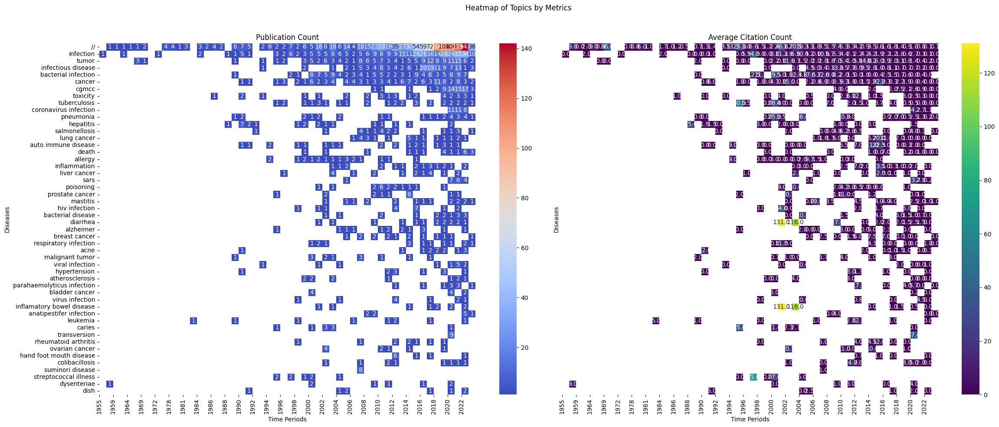

In [159]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data. Replace this with your actual DataFrame.
df = filtered_df

# Ensure that DataFrames are not empty
assert not df.empty, "Main DataFrame is empty!"

# Filter DataFrame based on column names
publication_columns = [col for col in df.columns if 'Publication Count' in col]
total_citations_columns = [col for col in df.columns if 'Total Citations' in col]
average_citation_count_columns = [col for col in df.columns if 'Average Citation Count' in col]

# Assertions to check if any DataFrame is empty
assert publication_columns, "No columns matched for 'Publication Count'"
assert total_citations_columns, "No columns matched for 'Total Citations'"
assert average_citation_count_columns, "No columns matched for 'Average Citation Count'"

publication_df = df[publication_columns]
average_citation_count_df = df[average_citation_count_columns]

# Extract year from column name function
def extract_year(column_name):
    if isinstance(column_name, tuple):
        return column_name[-1]
    return column_name.split()[-1]

# Generate subplots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Create the heatmaps
sns.heatmap(publication_df, annot=True, cmap="coolwarm", fmt=".0f", ax=axes[0], yticklabels=True)
axes[0].set_title('Publication Count')

sns.heatmap(average_citation_count_df, annot=True, cmap="viridis", fmt=".1f", ax=axes[1], yticklabels=False)
axes[1].set_title('Average Citation Count')


# Set both the x-ticks and their labels for the heatmap
x_ticks = [i for i, col in enumerate(publication_df.columns) if i % 2 == 0]  # Adjust the step if necessary
axes[0].set_xticks(x_ticks)
axes[0].set_xticklabels([extract_year(publication_df.columns[i]) for i in x_ticks])


x_ticks = [i for i, col in enumerate(average_citation_count_df.columns) if i % 2 == 0]  # Adjust the step if necessary
axes[1].set_xticks(x_ticks)
axes[1].set_xticklabels([extract_year(average_citation_count_df.columns[i]) for i in x_ticks])


# Common settings
axes[0].set_ylabel('Diseases')
for ax in axes:
    ax.set_xlabel('Time Periods')

# Super title for all subplots
plt.suptitle('Heatmap of Topics by Metrics')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
# plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Heatmap of TOPICs by Metrics.png", dpi=600)
plt.show()


## ICD-11 for Mortality and Morbidity Statistics (Version : 01/2023)



```
# https://icd.who.int/en
```



In [160]:
# import clean data
Diseases_counts_clean_ICD11 = pd.read_excel('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases_lemat_stop_clean_count_citation_therapy_ICD11.xlsx')[
    ['Diseases','Diseases_ICD11_parent1']]#.set_index('Diseases_lemat_stop_clean2')
Diseases_counts_clean_ICD11['Diseases_ICD11_parent1'] = Diseases_counts_clean_ICD11['Diseases_ICD11_parent1'].str.replace('\xa0', ' ')
Diseases_counts_clean_ICD11['Diseases'] = Diseases_counts_clean_ICD11['Diseases'].str.replace('\xa0', ' ')

Diseases_counts_clean_ICD11['Diseases_ICD11_parent1'] = Diseases_counts_clean_ICD11['Diseases_ICD11_parent1'].str.strip()
# Supprimer les espaces doubles ou multiples
Diseases_counts_clean_ICD11['Diseases_ICD11_parent1'] = Diseases_counts_clean_ICD11['Diseases_ICD11_parent1'].str.replace(r'\s+', ' ')
Diseases_counts_clean_ICD11

,Diseases,Diseases_ICD11_parent1
0,enteral disease,01 Certain infectious or parasitic diseases
1,opportunistic infection,01 Certain infectious or parasitic diseases
2,temporal infection,01 Certain infectious or parasitic diseases
3,abscess,01 Certain infectious or parasitic diseases
4,african swine fever,01 Certain infectious or parasitic diseases
...,...,...
821,typhimurium − dsm 32626 bacteriophage strain,NaN
822,vhs,NaN
823,xanthomonas arboricola pv juglandis preparation,NaN
824,bakterii oraz rozkładających bakteryjne,NaN


In [161]:
# import clean data
Diseases_counts_clean = pd.read_excel('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Microorganisms_Taxon_THERAPY/Diseases-count-citation-therapy_clean2.xls')[
    ['Diseases_lemat_stop','Diseases_lemat_stop_clean']]#.set_index('Diseases_lemat_stop_clean2')
Diseases_counts_clean['Diseases_lemat_stop_clean'] = Diseases_counts_clean['Diseases_lemat_stop_clean'].str.replace('\xa0', ' ')
Diseases_counts_clean['Diseases_lemat_stop'] = Diseases_counts_clean['Diseases_lemat_stop'].str.replace('\xa0', ' ')
Diseases_counts_clean

<ipython-input-161-b9c672da48d8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Diseases_counts_clean['Diseases_lemat_stop_clean'] = Diseases_counts_clean['Diseases_lemat_stop_clean'].str.replace('\xa0', ' ')
<ipython-input-161-b9c672da48d8>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Diseases_counts_clean['Diseases_lemat_stop'] = Diseases_counts_clean['Diseases_lemat_stop'].str.replace('\xa0', ' ')


,Diseases_lemat_stop,Diseases_lemat_stop_clean
0,acinetobacter,//
1,acinetobacter baumani,//
2,acinetobacter baumannii,//
3,acinetobacter baumannii phagolysate,//
4,actinobacillus,//
...,...,...
2336,xanthomonas infection,xanthomonas infection
2337,xeroderma pigmentosum,xeroderma pigmentosum
2338,zespołem,zespołem
2339,zooepidemicus,zooepidemicus


In [162]:
# Split and explode the 'Applicants' field
df_diseases = Diseases_data2.reset_index()['Diseases_lemat_stop'].str.split(',').explode().str.strip().to_frame()
    # Reset the index to re-organize data
df_diseases = df_diseases.drop_duplicates()
df_diseases

,Diseases_lemat_stop
0,phagotherapy
0,toxicity
0,tuberculosis
0,tuberculosis phagotherapy
0,tuberculosis phagotherapy field medicine
...,...
2365,haemophilus
2365,meningococcal encephalitis
2365,human immunodeficiency type 1 virus human immu...
2365,encephalitis


In [163]:
Diseases_counts_clean_all = df_diseases.merge(Diseases_counts_clean,
                                           left_on='Diseases_lemat_stop',
                                           right_on='Diseases_lemat_stop',
                                           how='left')#.set_index(['Lens ID','Application Year'])
#Diseases_list_and_cleanICD11 = Diseases_list_and_cleanICD11.drop('Diseases_lemat_stop_clean', axis = 1)

#Diseases_list_and_cleanICD11 = Diseases_list_and_cleanICD11.dropna(subset=['Diseases_ICD11_parent1'])
Diseases_counts_clean_all.drop_duplicates(inplace = True)
Diseases_counts_clean_all#.head(60)

,Diseases_lemat_stop,Diseases_lemat_stop_clean
0,phagotherapy,phagotherapy
1,toxicity,toxicity
2,tuberculosis,tuberculosis
3,tuberculosis phagotherapy,tuberculosis
4,tuberculosis phagotherapy field medicine,tuberculosis
...,...,...
1452,haemophilus,NaN
1453,meningococcal encephalitis,NaN
1454,human immunodeficiency type 1 virus human immu...,NaN
1455,encephalitis,encephalitis


In [164]:
Diseases_counts_clean_all.count()

,0
Diseases_lemat_stop,1457
Diseases_lemat_stop_clean,1388


In [165]:
Diseases_counts_clean_all[Diseases_counts_clean_all['Diseases_lemat_stop_clean'].isna()]

,Diseases_lemat_stop,Diseases_lemat_stop_clean
16,,NaN
111,salmonella infectious disease,NaN
123,enterotoxigenic e coli infectious disease,NaN
124,coli infectious disease,NaN
187,dsm 32629 dsm 32630 bacterio¬pha¬ge,NaN
...,...,...
1450,tick borne encephalitis,NaN
1452,haemophilus,NaN
1453,meningococcal encephalitis,NaN
1454,human immunodeficiency type 1 virus human immu...,NaN


In [166]:
Diseases_counts_clean_all['Diseases_lemat_stop_clean'].fillna(Diseases_counts_clean_all['Diseases_lemat_stop'], inplace=True)

Diseases_counts_clean_all.count()


<ipython-input-166-3c75b4fac7b1>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Diseases_counts_clean_all['Diseases_lemat_stop_clean'].fillna(Diseases_counts_clean_all['Diseases_lemat_stop'], inplace=True)


,0
Diseases_lemat_stop,1457
Diseases_lemat_stop_clean,1457


In [167]:
Diseases_list_and_cleanICD11 = Diseases_counts_clean_all.merge(Diseases_counts_clean_ICD11,
                                           left_on='Diseases_lemat_stop_clean',
                                           right_on='Diseases',
                                           how='outer')#.set_index(['Lens ID','Application Year'])
#Diseases_list_and_cleanICD11 = Diseases_list_and_cleanICD11.drop('Diseases_lemat_stop_clean', axis = 1)

#Diseases_list_and_cleanICD11 = Diseases_list_and_cleanICD11.dropna(subset=['Diseases_ICD11_parent1'])
Diseases_list_and_cleanICD11.drop_duplicates(inplace = True)
Diseases_list_and_cleanICD11#.head(60)

,Diseases_lemat_stop,Diseases_lemat_stop_clean,Diseases,Diseases_ICD11_parent1
0,,,NaN,NaN
1,aeruginosa,//,//,NaN
2,f27 12,//,//,NaN
3,acinetobacter,//,//,NaN
4,aureus,//,//,NaN
...,...,...,...,...
1473,zespołem,zespołem,zespołem,NaN
1474,zooepidemicus,zooepidemicus,zooepidemicus,NaN
1475,NaN,NaN,zoster,01 Certain infectious or parasitic diseases
1476,− dsm 32624,− dsm 32624,− dsm 32624,NaN


In [168]:
Diseases_list_and_cleanICD11['Diseases_lemat_stop'].nunique()

1451

In [169]:
Diseases_list_and_cleanICD11[Diseases_list_and_cleanICD11['Diseases'].isna()]

,Diseases_lemat_stop,Diseases_lemat_stop_clean,Diseases,Diseases_ICD11_parent1
0,,,NaN,NaN


In [170]:
Diseases_list_and_cleanICD11[['Diseases_lemat_stop','Diseases_ICD11_parent1']]

,Diseases_lemat_stop,Diseases_ICD11_parent1
0,,NaN
1,aeruginosa,NaN
2,f27 12,NaN
3,acinetobacter,NaN
4,aureus,NaN
...,...,...
1473,zespołem,NaN
1474,zooepidemicus,NaN
1475,NaN,01 Certain infectious or parasitic diseases
1476,− dsm 32624,NaN


In [171]:
#Diseases_data2[['Applicants','Inventors','Jurisdiction','Diseases_lemat_stop']]

In [172]:
Diseases_data2[['Diseases_lemat_stop']]

,,,Diseases_lemat_stop
Lens ID,Application Year,Cited by Patent Count,
069-390-611-717-343,2001,4,"phagotherapy, toxicity, tuberculosis, phagothe..."
114-759-028-882-736,2015,1,"bacterial infection, bacterial infection, bact..."
094-982-928-461-863,2015,0,"bacterial infection, bacterial infection, bact..."
167-908-891-122-112,2015,1,"bacterial infection, bacterial infection, bact..."
112-018-476-081-94X,2017,3,"bacterial infection, bacterial infection, bact..."
...,...,...,...
150-422-589-010-681,1966,0,"herpes, herpes, herpes, adenin, herpes"
058-819-734-343-222,1966,0,"tumour, tumour, tumour, e g a, can be, deazaad..."
104-088-331-962-598,2018,0,"no 83, cancer, cancer, cm, gn, mr, td, cancer,..."


In [173]:
def clean_diseases(df1, df2):
    # Create a dictionary from df2 for mapping
    disease_dict = df2.set_index('Diseases_lemat_stop')['Diseases_ICD11_parent1'].to_dict()

    # Function to clean a single cell
    def clean_cell(cell):
        diseases = cell.split(', ')
        # Replace disease names and remove duplicates
        cleaned = list(set([disease_dict.get(disease, disease) for disease in diseases if isinstance(disease_dict.get(disease, disease), str)]))
        return ', '.join(cleaned)

    # Apply the function to each cell in the 'Diseases_lemat_stop2' column
    df1['Clean_Diseases'] = df1['Diseases_lemat_stop'].apply(clean_cell)

    return df1

# Use the function
#df1_clean = clean_diseases(df1, df2)


In [174]:
df1_clean = clean_diseases(Diseases_data2, Diseases_list_and_cleanICD11).reset_index()
df1_clean

,Lens ID,Application Year,Cited by Patent Count,#,Jurisdiction,Kind,Display Key,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Diseases_lemat,Diseases_lemat_stop,Diseases_lemat_stop2,Clean_Diseases
0,069-390-611-717-343,2001,4,1,RU,C2,RU 2214829 C2,2003-10-27,2003,RU 2001129920 A,2001-11-05,RU 2001129920 A,2001-11-05,METHOD FOR TUBERCULOSIS PHAGOTHERAPY,"FIELD: medicine, phthisiology. SUBSTANCE: meth...",NOVOSIB NII T;;UBERKULEZA,KURUNOV JU N;;KURUNOVA N N;;SHATALOVA N D,NaN,https://lens.org/069-390-611-717-343,Granted Patent,no,0,1,1,0,NaN,A61K35/76;;A61P31/06,NaN,0,0,NaN,NaN,NaN,EXPIRED,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD me...,method for tuberculosis phagotherapy field me...,method for tuberculosis phagotherapy field: me...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD ME...,METHOD FOR TUBERCULOSIS PHAGOTHERAPY FIELD: me...,"phagotherapy , toxicity , tuberculosis , phago...",[],"(mycobacteriophage D29, mycobacteriophage D29,...","phagotherapy , toxicity , tuberculosis , phago...","phagotherapy, toxicity, tuberculosis, phagothe...","phagotherapy, toxicity, tuberculosis, phagothe...",01 Certain infectious or parasitic diseases
1,114-759-028-882-736,2015,1,2,JP,A,JP 2016104011 A,2016-06-09,2016,JP 2015243657 A,2015-12-14,US 38401510 P,2010-09-17,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",PROBLEM TO BE SOLVED: To provide novel bacteri...,TECNIFAR-INDUSTRIA TECNICA FARM S A;;TECHNOPHA...,MIGUEL ANGELO DA COSTA GARCIA;;CARLOS JORGE SO...,NaN,https://lens.org/114-759-028-882-736,Patent Application,no,1,48,48,1300,C12N2795/00032;;A61K31/505;;A61K31/7056;;A61K3...,C12N7/00;;A61K35/76;;A61P31/04;;C12N15/09,NaN,0,0,NaN,NaN,NaN,ACTIVE,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,antibacterial phages phage peptides and use m...,"antibacterial phages, phage peptides and use m...","ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...",ANTIBACTERIAL PHAGES PHAGE PEPTIDES AND USE M...,"ANTIBACTERIAL PHAGES, PHAGE PEPTIDES AND USE M...","bacterial infection , bacterial infection , ba...",[],(),"bacterial infection , bacterial infection , ba...","bacterial infection, bacterial infection, bact...","bacterial infection, bacterial infection, bact...",01 Certain infectious or parasitic diseases
2,094-982-928-461-863,2015,0,3,AU,A1,AU 2015/255318 A1,2015-12-03,2015,AU 2015/255318 A,2015-11-13,AU 2015/255318 A;;AU 2010/211456 A;;US 2183450...,2009-02-06,"Antibacterial phage, phage peptides and method...",The present invention is directed to the field...,TECNIFAR INDÚSTRIA TÉCNICA FARMACÉUTICA S A;;T...,DA COSTA GARCIA MIGUEL ÂNGELO;;SOUSA DE SÃO JO...,"TECHNOPHAGE, INVESTIGACAO E DESENVOLVIMENTO EM...",https://lens.org/094-982-928-461-863,Patent Application,no,0,3,45,0,NaN,A61K35/76;;C12N9/14;;G01N33/569,NaN,0,0,NaN,NaN,NaN,ACTIVE,"Antibacterial phage, phage peptides and method...",Antibacterial phage phage peptides and method...,antibacterial phage phage peptides and method...,"antibacterial phage, phage peptides and method...","ANTIBACTERIAL PHAGE, PHAGE PEPTIDES AND METHOD...",ANTIBACTERIAL PHAGE PHAGE PEPTIDES AND METHOD...,"Antibacterial phage, phage peptides and method...","bacterial infections , bacterial infection , b...",['F87s/06'],(),"bacterial infection , bacterial infection , ba...","bacterial infection,

In [175]:
df1_clean.reset_index()['Clean_Diseases'][2365]

'12 Diseases of the respiratory system, 02 Neoplasms, 13 Diseases of the digestive system, 01 Certain infectious or parasitic diseases'

In [176]:
df1_clean.reset_index()['Diseases_lemat_stop'][2365]

'tumor, human immunodeficiency type 1 virus, human immunodeficiency type 2 virus, cell leukemia, simplex type 2 virus, measles like, parainfluenza, tick borne encephalitis, poliomyelitis, clostridium, chlamydia, tetanus, haemophilus, pneumonia, typhoid fever, meningococcal encephalitis, tumor, human immunodeficiency type 1 virus human immunodeficiency type 2 virus t cell leukemia virus, encephalitis, poliomyelitis, clostridium, tetanus, typhoid fever, meningococcal encephalitis, tumor, human immunodeficiency type 1 virus, human immunodeficiency type 2 virus, cell leukemia, simplex type 2 virus, measles like, parainfluenza, hepatitis, hepatitis, tick borne encephalitis, poliomyelitis, clostridium, chlamydia, tetanus, haemophilus, hepatitis, pneumonia, hepatitis, typhoid fever, meningococcal encephalitis, rhabdovirus, tumor, human immunodeficiency type 1 virus human immunodeficiency type 2 virus t cell leukemia virus, hepatitis, hepatitis, encephalitis, poliomyelitis, clostridium, tetanu

In [177]:
df1_clean['Clean_Diseases'].count()

2366

In [178]:
df1_clean['Clean_Diseases'][2364]

''

In [179]:
df1_clean['Clean_Diseases'].replace('',np.nan).count()

1360

## Graph

In [180]:
data = data.merge(df1_clean[['Lens ID','Clean_Diseases']],
                                           left_on='Lens ID',
                                           right_on='Lens ID',
                                           how='outer')

data.drop_duplicates(inplace = True)
data.head()

,#,Jurisdiction,Kind,Display Key,Lens ID,Publication Date,Publication Year,Application Number,Application Date,Priority Numbers,Earliest Priority Date,Title,Abstract,Applicants,Inventors,Owners,URL,Document Type,Has Full Text,Cites Patent Count,Cited by Patent Count,Simple Family Size,Extended Family Size,Sequence Count,CPC Classifications,IPCR Classifications,US Classifications,NPL Citation Count,NPL Resolved Citation Count,NPL Resolved Lens ID(s),NPL Resolved External ID(s),NPL Citations,Legal Status,Title_Abstract,Title_Abstract_punc,Title_Abstract_punc_lower,Title_Abstract_lower,Title_Abstract_upper,Title_Abstract_punc_upper,Title_Abstract_concat,Diseases,Microorganisms,Taxons,Application Year,Topic N°,Earliest Priority Year,Application_Year_Range,IPCR Sections,IPCR Class,IPCR Subclass,Jurisdiction_name,Jurisdiction_Region,Inventors_clean,Applicants_clean,applicants_clean_not_individual,Applicants_countries,Applicants_regions,Applicants_categories,Applicants_Last_Classification,Inventors_Last_Classification,Clean_Diseases
0,1957,US,A1,US 2007/0149768 A1,000-009-934-959-102,2007-06-28,2007,US 38802506 A,2006-03-22,US 38802506 A;;US 2992601 A;;US 25894800 P,2000-12-29,Specific human antibodies for selective cancer...,The present invention is directed to a peptide...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,HAGAY YOCHEVED;;LAZAROVITS JANETTE;;GUY RACHEL...,NaN,https://lens.org/000-009-934-959-102,Patent Application,yes,22,0,3,41,241,C07K16/005;;C07K16/005;;C07K16/3061;;C07K16/30...,C07K16/30;;C07K16/00,530/388.8,0,0,NaN,NaN,NaN,DISCONTINUED,Specific human antibodies for selective cancer...,Specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,specific human antibodies for selective cancer...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,SPECIFIC HUMAN ANTIBODIES FOR SELECTIVE CANCER...,Specific human antibodies for selective cancer...,"['cancer', 'cancer', 'acute myeloid leukemia',...","['human antibodies', 'Fv', 'human antibodies',...",(),2006,Topic 7,2000,2005-2009,C,C07,C07K,United States,North America,PERETZ TUVIA;;LAZAROVITS JANETTE;;HAGAY YOCHEV...,PERETZ TUVIA;;HAGAI YOCHEVED;;LAZAROVITS JANET...,,,,Individual,Transient;;Terminator,Transient;;Terminator,02 Neoplasms
1,899,CN,A,CN 111053790 A,000-020-768-397-569,2020-04-24,2020,CN 201911213157 A,2019-12-02,CN 201911213157 A,2019-12-02,Pathogenic Escherichia coli phage oral prepara...,A phage Phage-HY19 with a strong cracking effe...,UNIV HENGYANG NORMAL,TANG QINGHAI;;YANG HAI;;YANG KUN;;TENG WEI;;YA...,NaN,https://lens.org/000-020-768-397-569,Patent Application,no,3,1,2,2,0,A61K35/76;;A61K9/146;;C12N7/00;;A61P31/04;;A61...,A61K35/76;;A61K9/14;;A61K47/36;;A61P1/12;;A61P...,NaN,1,0,NaN,NaN,"王福金等主编: ""《实验室生物实验手册》"", 28 February 2017",ACTIVE,Pathogenic Escherichia coli phage oral prepara...,Pathogenic Escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,pathogenic escherichia coli phage oral prepara...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,PATHOGENIC ESCHERICHIA COLI PHAGE ORAL PREPARA...,Pathogenic Escherichia coli phage oral prepara...,"['diarrhea', 'diarrhea', 'diarrhea', 'diarrhea...","['Escherichia coli phage oral', 'Escherichia c...","(Escherichia coli, Escherichia coli, ETEC-K88a...",2019,Topic 8,2019,2015-2019,A;;C,A61;;C12,A61K;;A61P;;C12N,China,Asia,LIU HUIJING;;YANG CAN;;YANG HAI;;TANG QINGHAI;...,UNIV HENGYANG NORMAL,UNIV HENGYANG NORMAL,China,Asia,Academic,Terminator,Transient;;Terminator,21 Symptoms- signs or clinical findings- not e...
2,1415,JP,A,JP 2002112779 A,000-046-524-713-954,2002-04-16,2002,JP 2000304143 A,2000-10-03,JP 2000304143 A,2000-10-03,HUMAN BLADDER CANCER ANTIGEN,PROBLEM TO BE SOLVED: To obtain a human bladde...,KEIO GIJUKU,KAWAKAMI YUTAKA;;FUJITA TOMONOBU;;ITO KEIICHI,NaN,https://lens.org/000-046-524-713-954,Patent Application,no,0,1,1,1,26,NaN,A01K67/027;;A61K38/00;;A61K39/00;;A61K45/00;;A...,NaN,0,0,NaN,NaN,NaN,PENDING,HUMAN BLADDER C

# Heatmap graph trend

## functions

In [181]:
import pandas as pd

def group_and_pivot_applicants(col_name, applicants_list2: pd.DataFrame) -> pd.DataFrame:
    """
    Group patent data by 'Application Year' and 'Applicants' and then pivot the result.

    Parameters:
    - applicants_list2 (pd.DataFrame): DataFrame containing patent data.

    Returns:
    - pd.DataFrame: Pivoted DataFrame with metrics as multi-level columns and years as sub-columns.
    """
    # Set the index
    applicants_data = data.set_index(['Lens ID', 'Application Year', 'Cited by Patent Count'])

    # Split and explode the 'Applicants' field
    applicants_list = applicants_data[col_name].str.split(',').explode().str.strip()

    # Count the unique applicants names
    unique_applicants_count = applicants_list.nunique()
    print('The number of unique applicants is:', unique_applicants_count)

    # Reset the index to re-organize data
    applicants_list2 = applicants_list.to_frame().reset_index()

    # Convert 'Application Year' to integer type if it's not
    applicants_list2['Application Year'] = applicants_list2['Application Year'].astype(int)

    # Group by 'Application Year' and 'Applicants', count number of patents
    # and sum citations within each group
    grouped = applicants_list2.groupby(['Application Year', col_name]).agg({
        'Lens ID': 'count',
        'Cited by Patent Count': 'sum'
    }).reset_index()

    # Calculate the average citation count
    grouped['Average Citation Count'] = grouped['Cited by Patent Count'] / grouped['Lens ID']

    # Rename columns for clarity
    grouped.columns = ['Application Year', col_name, 'Publication Count', 'Total Citations', 'Average Citation Count']

    # Pivot the DataFrame to have metrics as multi-level columns and years as sub-columns
    pivot_df = grouped.pivot_table(index=col_name, columns='Application Year', values=['Publication Count', 'Total Citations', 'Average Citation Count'], aggfunc='sum')
    if '' in pivot_df.index:
      pivot_df.drop('', inplace=True)

    pivot_df = pivot_df.replace(0.0, np.nan)

    return pivot_df

# Usage
#pivot_df = group_and_pivot_applicants('Applicants_countries',data)

# You might want to fill them with a value or drop them, depending on your needs
#pivot_df.fillna(0, inplace=True)  # Replace NaNs with 0, or use `df.dropna()` to remove

# Convert all columns to integers
#pivot_df = pivot_df.astype(int)

# Round the numbers and convert to integer
#pivot_df = pivot_df.round(0).astype(int)
#pivot_df


In [182]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(col_name, pivot_df, metric, xlabel, ylabel,n_largest,figsize):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    #pivot_df = group_and_pivot_applicants(data)
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df[metric].sum(axis=1).nlargest(n_largest).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=figsize)

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    data_to_plot[col_name] = data_to_plot.apply(lambda row: f"{row[col_name].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index(col_name)

    # Create the heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.xticks(fontsize=14, fontweight='bold')
    plt.yticks(fontsize=14, fontweight='bold')
    #plt.title(f"Heatmap of {metric} by Application Year for Top 50 Applicants", fontsize=18, fontweight='bold')
    plt.xlabel(xlabel, fontsize=16, fontweight='bold')
    plt.ylabel(ylabel, fontsize=16, fontweight='bold')
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
#plot_top_50_heatmap(pivot_df, "Publication Count")
#plot_top_50_heatmap(pivot_df, "Total Citations")
#plot_top_50_heatmap(pivot_df, "Average Citation Count")


In [183]:
import textwrap

def wrap_text(text, width=5):
    """Wrap text to the specified width."""
    lines = textwrap.wrap(text, width=width)
    return '\n'.join(lines)
wrap_text('1st phage genome seqenced')

'1st\nphage\ngenom\ne seq\nenced'

In [184]:
# Define the text you want to modify
text = 'This is a long text that needs to be modified.'

# Wrap the text using the wrap_text() function
wrapped_text = wrap_text(text, width=10)

# Print the modified text
print(wrapped_text)


This is a
long text
that needs
to be
modified.


In [185]:
def plot_elt_counts_by_year(col_name, data, n_largest):
    pivot_df = group_and_pivot_applicants(col_name, data)
    top_50_applicants = pivot_df['Publication Count'].sum(axis=1).nlargest(n_largest).index
    top_50_data = pivot_df.loc[top_50_applicants]
    top_50_data.index = top_50_data.index.to_series().str.title()

    def convert_to_int(x):
        return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data:
        top_50_data[col] = top_50_data[col].apply(convert_to_int)

    topic_counts_by_year = top_50_data['Publication Count'].T
    n_topics = len(topic_counts_by_year.columns)
    n_rows = (n_topics + 4) // 5
    fig, axes = plt.subplots(n_rows, 5, figsize=(20, n_rows * 3.5), sharex=True)
    axes_flat = axes.flatten()

    for i, topic in enumerate(topic_counts_by_year.columns):
        axes_flat[i].plot(
            topic_counts_by_year.index,
            topic_counts_by_year[topic]
        )
        axes_flat[i].set_title(f'{topic}', fontsize=18, fontweight='bold')
        axes_flat[i].grid(True, which='both', linestyle='--', linewidth=0.5)

        if i // 5 == n_rows - 1:
            axes_flat[i].set_xlabel('Year', fontsize=17, fontweight='bold')
        if i % 5 == 0:
            axes_flat[i].set_ylabel('Frequency', fontsize=17, fontweight='bold')

        for tick in axes_flat[i].xaxis.get_major_ticks():
            tick.label.set_fontsize(16)
            tick.label.set_fontweight('bold')
            tick.label.set_rotation(90)
        for tick in axes_flat[i].yaxis.get_major_ticks():
            tick.label.set_fontsize(16)
            tick.label.set_fontweight('bold')

    for i in range(n_topics, len(axes_flat)):
        fig.delaxes(axes_flat[i])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


## applicants TREND

The number of unique applicants is: 21


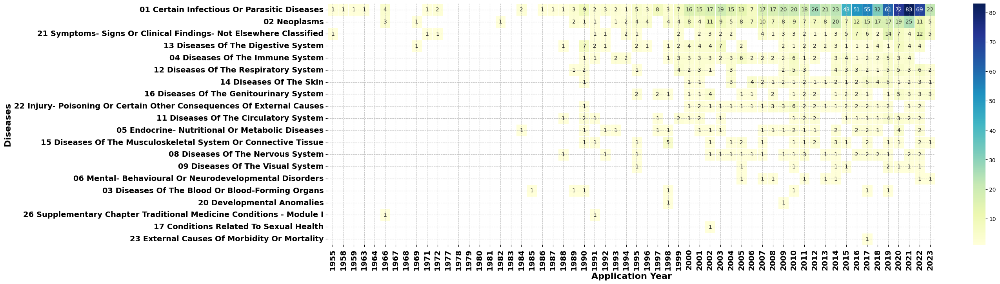

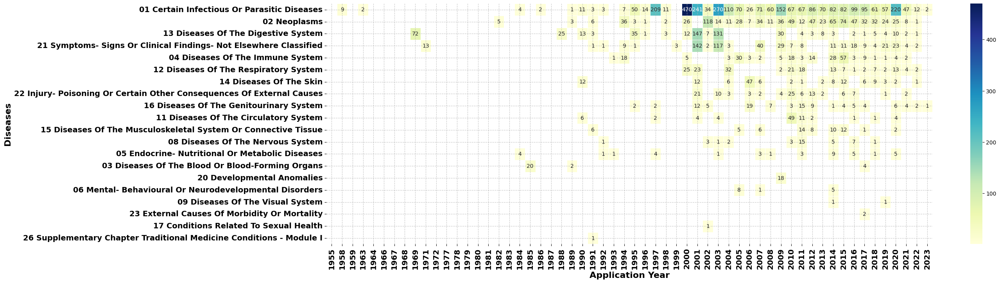

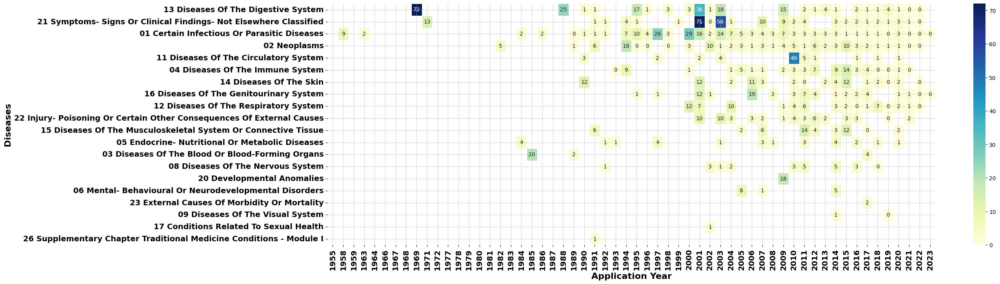

In [186]:
col_name = 'Clean_Diseases'
xlabel = "Application Year"
ylabel = 'Diseases'
pivot_df = group_and_pivot_applicants(col_name,data)
figsize=(25, 8)
n_largest = 52

plot_top_50_heatmap(col_name, pivot_df, "Publication Count", xlabel, ylabel,n_largest,figsize)
plot_top_50_heatmap(col_name, pivot_df, "Total Citations", xlabel, ylabel,n_largest,figsize)
plot_top_50_heatmap(col_name, pivot_df, "Average Citation Count", xlabel, ylabel,n_largest,figsize)

In [187]:
pivot_df["Publication Count"].sum(axis=1).nlargest(25)

,0
Clean_Diseases,
01 Certain infectious or parasitic diseases,814.0
02 Neoplasms,284.0
21 Symptoms- signs or clinical findings- not elsewhere classified,99.0
13 Diseases of the digestive system,74.0
04 Diseases of the immune system,71.0
12 Diseases of the respiratory system,61.0
14 Diseases of the skin,46.0
16 Diseases of the genitourinary system,41.0
22 Injury- poisoning or certain other consequences of external causes,40.0


In [188]:
pivot_df["Publication Count"].sum(axis=1).reset_index()

,Clean_Diseases,0
0,01 Certain infectious or parasitic diseases,814.0
1,02 Neoplasms,284.0
2,03 Diseases of the blood or blood-forming organs,7.0
3,04 Diseases of the immune system,71.0
4,05 Endocrine- nutritional or metabolic diseases,29.0
5,06 Mental- behavioural or neurodevelopmental d...,8.0
6,08 Diseases of the nervous system,27.0
7,09 Diseases of the visual system,10.0
8,11 Diseases of the circulatory system,31.0
9,12 Diseases of the respiratory system,61.0


In [189]:
pivot_df["Publication Count"].sum(axis=1).reset_index()['Clean_Diseases'][0]

'01 Certain infectious or parasitic diseases'

In [190]:
pivot_df["Publication Count"].sum(axis=1).reset_index()['Clean_Diseases'][1]

'02 Neoplasms'

In [191]:
# prompt: some diseases names are present multiple time because some have these characters '\xa0', and that impact the count. this is an example : "01 Certain infectious or parasitic diseases" and "01\xa0Certain infectious or parasitic diseases'. why this hapen, and how to manage ?

import pandas as pd

# Assuming your DataFrame is named 'Diseases_list_and_clean'
# Replace 'Diseases_lemat_stop_clean' with the actual column name if different

# Remove non-breaking spaces
#Diseases_list_and_clean['Diseases_lemat_stop_clean'] = Diseases_list_and_clean['Diseases_lemat_stop_clean'].str.replace('\xa0', ' ')

# Now perform your grouping and other operations
#grouped = Diseases_list_and_clean.groupby(['Application Year','Diseases_lemat_stop_clean']).agg({'Lens ID': 'count', 'Cited by Patent Count': 'sum'}).reset_index()
# ... rest of your code

In [192]:
top10diseases = pivot_df["Publication Count"].sum(axis=1).nlargest(16).drop('21 Symptoms- signs or clinical findings- not elsewhere classified').index
top10diseases

Index(['01 Certain infectious or parasitic diseases', '02 Neoplasms',
       '13 Diseases of the digestive system',
       '04 Diseases of the immune system',
       '12 Diseases of the respiratory system', '14 Diseases of the skin',
       '16 Diseases of the genitourinary system',
       '22 Injury- poisoning or certain other consequences of external causes',
       '11 Diseases of the circulatory system',
       '05 Endocrine- nutritional or metabolic diseases',
       '15 Diseases of the musculoskeletal system or connective tissue',
       '08 Diseases of the nervous system', '09 Diseases of the visual system',
       '06 Mental- behavioural or neurodevelopmental disorders',
       '03 Diseases of the blood or blood-forming organs'],
      dtype='object', name='Clean_Diseases')

In [193]:
diseases_data_to_plot = pivot_df["Publication Count"].T[top10diseases]
diseases_data_to_plot

Clean_Diseases,01 Certain infectious or parasitic diseases,02 Neoplasms,13 Diseases of the digestive system,04 Diseases of the immune system,12 Diseases of the respiratory system,14 Diseases of the skin,16 Diseases of the genitourinary system,22 Injury- poisoning or certain other consequences of external causes,11 Diseases of the circulatory system,05 Endocrine- nutritional or metabolic diseases,15 Diseases of the musculoskeletal system or connective tissue,08 Diseases of the nervous system,09 Diseases of the visual system,06 Mental- behavioural or neurodevelopmental disorders,03 Diseases of the blood or blood-forming organs
Application Year,,,,,,,,,,,,,,,
1955,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1958,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1966,4.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1967,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1969,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


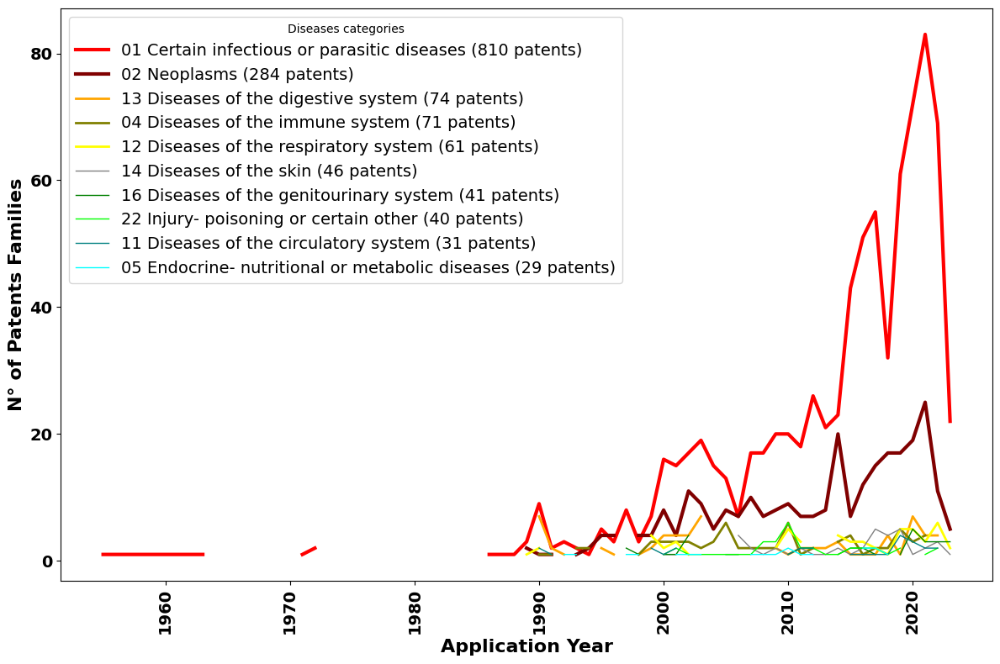

In [194]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming your data is in a CSV file called 'patent_data.csv'
data_trend = diseases_data_to_plot.reset_index()

# Rename your columns for easier access
data_trend.columns = ['Application Year', '01 Certain infectious or parasitic diseases', '02 Neoplasms',
       '13 Diseases of the digestive system',
       '04 Diseases of the immune system',
       '12 Diseases of the respiratory system', '14 Diseases of the skin',
       '16 Diseases of the genitourinary system',
       '22 Injury- poisoning or certain other consequences of external causes',
       '11 Diseases of the circulatory system',
       '05 Endocrine- nutritional or metabolic diseases',
       '15 Diseases of the musculoskeletal system or connective tissue',
       '08 Diseases of the nervous system', '09 Diseases of the visual system',
       '06 Mental- behavioural or neurodevelopmental disorders',
       '03 Diseases of the blood or blood-forming organs']

# Sort data by Year for proper plotting
data_trend2 = data_trend.sort_values('Application Year')

# Define the x (Year) values
x = data_trend2['Application Year'].astype(float).values

# Plotting each category individually
fig = plt.figure(figsize=(12, 8))  # Increased figure size

# Choosing distinct and appropriate colors for each category
# Increasing the linewidth for all plots to make them bold
plt.plot(x, data_trend2['01 Certain infectious or parasitic diseases'], label='01 Certain infectious or parasitic diseases (810 patents)', color='red', linewidth=3.)
plt.plot(x, data_trend2['02 Neoplasms'], label='02 Neoplasms (284 patents)', color='maroon', linewidth=3.)
plt.plot(x, data_trend2['13 Diseases of the digestive system'], label='13 Diseases of the digestive system (74 patents)', color='orange', linewidth=2)
plt.plot(x, data_trend2['04 Diseases of the immune system'], label='04 Diseases of the immune system (71 patents)', color='olive', linewidth=2)
plt.plot(x, data_trend2['12 Diseases of the respiratory system'], label='12 Diseases of the respiratory system (61 patents)', color='yellow', linewidth=2.)

plt.plot(x, data_trend2['14 Diseases of the skin'], label='14 Diseases of the skin (46 patents)', color='gray', linewidth=1.)
plt.plot(x, data_trend2['16 Diseases of the genitourinary system'], label='16 Diseases of the genitourinary system (41 patents)', color='green', linewidth=1)
plt.plot(x, data_trend2['22 Injury- poisoning or certain other consequences of external causes'], label='22 Injury- poisoning or certain other (40 patents)', color='lime', linewidth=1)
plt.plot(x, data_trend2['11 Diseases of the circulatory system'], label='11 Diseases of the circulatory system (31 patents)', color='teal', linewidth=1.)
plt.plot(x, data_trend2['05 Endocrine- nutritional or metabolic diseases'], label='05 Endocrine- nutritional or metabolic diseases (29 patents)', color='cyan', linewidth=1.)

#plt.plot(x, data_trend2['15 Diseases of the musculoskeletal system or connective tissue'], label='15 Diseases of the musculoskeletal system or connective tissue (28 patents)', color='blue', linewidth=1)
#plt.plot(x, data_trend2['08 Diseases of the nervous system'], label='08 Diseases of the nervous system (27 patents)', color='navy', linewidth=1)
#plt.plot(x, data_trend2['09 Diseases of the visual system'], label='09 Diseases of the visual system (10 patents)', color='fuchsia', linewidth=1.)
#plt.plot(x, data_trend2['06 Mental- behavioural or neurodevelopmental disorders'], label='06 Mental- behavioural or neurodevelopmental disorders (8 patents)', color='purple', linewidth=1.)
#plt.plot(x, data_trend2['03 Diseases of the blood or blood-forming organs'], label='03 Diseases of the blood or blood-forming organs (7 patents)', color='pink', linewidth=1)


# Add title and labels with increased font sizes
#plt.title('Patent Activity by Category in Phage Therapy (1955-2023)', fontsize=18)
plt.xlabel('Application Year', fontsize=16, fontweight='bold')
plt.ylabel('N° of Patents Families', fontsize=16, fontweight='bold')

# Increase legend and tick font size
plt.legend(title='Diseases categories',loc='upper left', fontsize=14)
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')

# Display the plot
plt.xticks(rotation=90)
plt.tight_layout()  # Adjust the layout to prevent clipping
plt.show()



In [195]:
plt.tight_layout(pad=10)
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4a.eps', format='eps', bbox_inches='tight')
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4a.png', format='png')


<Figure size 640x480 with 0 Axes>

In [196]:
#col_name = 'IPCR Subclass'
n_largest = 10
#plot_elt_counts_by_year(col_name, data, n_largest)

# Heatmap graph diseases

## function

In [197]:
from operator import index
def process_data(data, index_cols, split_col, top_n_index, top_n_col):
  # Set the index
  applicants_data = data.set_index(['Lens ID', index_cols])

  # top_n_index_split_col
  top_n_index_split_col = data[split_col].str.split(',').explode().str.strip().str.title().to_frame()
  top_n_index_split_col = top_n_index_split_col.reset_index()
  top_n_index_split_col = top_n_index_split_col[top_n_index_split_col[split_col] != '']
  top_n_index_split_col = top_n_index_split_col[split_col].value_counts().head(top_n_index).index.to_list()

  # top_n_index_split_col
  top_n_col_index_cols = data[index_cols].str.split(';;').explode().str.strip().str.title().to_frame()
  top_n_col_index_cols = top_n_col_index_cols.reset_index()
  top_n_col_index_cols = top_n_col_index_cols[top_n_col_index_cols[index_cols] != '']
  top_n_col_index_cols = top_n_col_index_cols[index_cols].value_counts().head(top_n_col).index.to_list()

  # Split and explode the 'Applicants' field
  applicants_list = applicants_data[split_col].str.split(',').explode().str.strip().to_frame()
      # Reset the index to re-organize data
  applicants_list2 = applicants_list.reset_index()
  applicants_list2[split_col] = applicants_list2[split_col].str.title()
  #applicants_list2 = applicants_list2[applicants_list2[index_cols] != '']
  #applicants_list2 = applicants_list2[applicants_list2[split_col] != '']

  # Set the index
  applicants_list3 = applicants_list2.set_index(['Lens ID', split_col])

  # Split and explode the 'Applicants' field
  applicants_list4 = applicants_list3[index_cols].str.split(';;').explode().str.strip().to_frame()
      # Reset the index to re-organize data
  applicants_list4 = applicants_list4.reset_index()
  applicants_list4[index_cols] = applicants_list4[index_cols].str.title()
  #applicants_list4 = applicants_list4[applicants_list4[index_cols] != '']
  #applicants_list4 = applicants_list4[applicants_list4[split_col] != '']

  grouped = applicants_list4.groupby([index_cols, split_col]).agg({
      'Lens ID': 'count'
  }).reset_index()

  pivot_df = grouped.pivot_table(index=split_col, columns=index_cols, values=['Lens ID'], aggfunc='sum')['Lens ID']
  #pivot_df2 = pivot_df[top_n_col_index_cols].T
  pivot_df2 = pd.DataFrame()
  missing_values = [value for value in top_n_col_index_cols if value not in pivot_df.columns]
  if missing_values:
      print(f"These values are missing in the index: {missing_values}")
  else:
      pivot_df2 = pivot_df[top_n_col_index_cols].T
  pivot_df2

  #pivot_df3 = pivot_df2[top_n_index_split_col].T
  pivot_df3 = pd.DataFrame()
  missing_values = [value for value in top_n_index_split_col if value not in pivot_df2.columns]
  if missing_values:
      print(f"These values are missing in the index: {missing_values}")
  else:
      pivot_df3 = pivot_df2[top_n_index_split_col].T
  pivot_df3
  return pivot_df3


In [198]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap(pivot_df, split_col, top_n_index, figsize, xlabel, ylabel):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """

    # Ensure the index is properly formatted
    pivot_df.index = pivot_df.index.to_series().str.title()

    # Round the values and convert to integer
    pivot_df = pivot_df.fillna(0)
    pivot_df = np.round(pivot_df).astype('int64')
    pivot_df = pivot_df.replace(0, np.nan)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in pivot_df :
      pivot_df[col] = pivot_df[col].apply(convert_to_int)

    fig = plt.figure(figsize=figsize)

    # Extract data for the given metric
    data_to_plot = pivot_df.reset_index()

    # Wrapping title with year and applicant name
    #data_to_plot['Applicants_categories'] = data_to_plot.apply(lambda row: f"{row['Applicants_categories'].title()}", axis=1)
    data_to_plot[split_col] = data_to_plot.apply(lambda row: f"{row[split_col].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index(split_col)

    # Create the heatmap
    if data_to_plot.empty:
        print("The DataFrame is empty.")
    else:
        sns.heatmap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.xticks(fontsize=14, fontweight='bold')
    plt.yticks(fontsize=14, fontweight='bold')
    #plt.title(f"Heatmap of Top 50 Applicants and the Top 25 IPCR Subclass", fontsize=18, fontweight='bold')
    plt.xlabel(xlabel, fontsize=16, fontweight='bold')
    plt.ylabel(ylabel, fontsize=16, fontweight='bold')
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

    return fig  # Return the Figure object


In [199]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_top_50_heatmap_cluster(pivot_df_ipcr, split_col, top_n_index, metric, figsize, xlabel, ylabel):
    """
    Plot a heatmap for the given metric for top 50 companies based on Publication Count.

    Args:
    - pivot_df (pd.DataFrame): The pivoted DataFrame with metrics for each applicant over different application years.
    - metric (str): The metric based on which the top 50 companies are determined. Default is 'Publication Count'.

    Returns:
    None
    """
    # Determine the top 50 companies based on the given metric
    top_50_applicants = pivot_df_ipcr[metric].sum(axis=1).nlargest(top_n_index).index

    # Filter pivot_df to only include these top 50 companies
    top_50_data = pivot_df_ipcr.loc[top_50_applicants]

    # Ensure the index is properly formatted
    top_50_data.index = top_50_data.index.to_series().str.title()

    # Round the values and convert to integer
    #top_50_data = np.round(top_50_data).astype(int)

    def convert_to_int(x):
      return int(x) if not pd.isna(x) else np.nan

    for col in top_50_data :
      top_50_data[col] = top_50_data[col].apply(convert_to_int)

    plt.figure(figsize=figsize)

    # Extract data for the given metric
    data_to_plot = top_50_data[metric].reset_index()

    # Wrapping title with year and applicant name
    #data_to_plot['Applicants_categories'] = data_to_plot.apply(lambda row: f"{row['Applicants_categories'].title()}", axis=1)
    data_to_plot[split_col] = data_to_plot.apply(lambda row: f"{row[split_col].title()}", axis=1)

    # Set the Applicants column as the index
    data_to_plot = data_to_plot.set_index(split_col)

    # Create the heatmap
    sns.clustermap(data_to_plot, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5, cbar_kws={"orientation": "vertical"})

    plt.xticks(fontsize=14, fontweight='bold')
    plt.yticks(fontsize=14, fontweight='bold')
    #plt.title(f"Heatmap of Top 50 Applicants and the Top 25 IPCR Subclass", fontsize=18, fontweight='bold')
    plt.xlabel(xlabel, fontsize=16, fontweight='bold')
    plt.ylabel(ylabel, fontsize=16, fontweight='bold')
    plt.grid( linestyle='--', alpha=0.7) #axis='x',
    plt.show()

# Example Usage:
# Assuming 'pivot_df' is your DataFrame with the required metrics.
#plot_top_50_heatmap(pivot_df_ipcr_applT50, "Lens ID")
#plot_top_50_heatmap(pivot_df_ipcr_applT50, "Total Citations")
#plot_top_50_heatmap(pivot_df_ipcr_applT50, "Average Citation Count")


##  Applicants categories

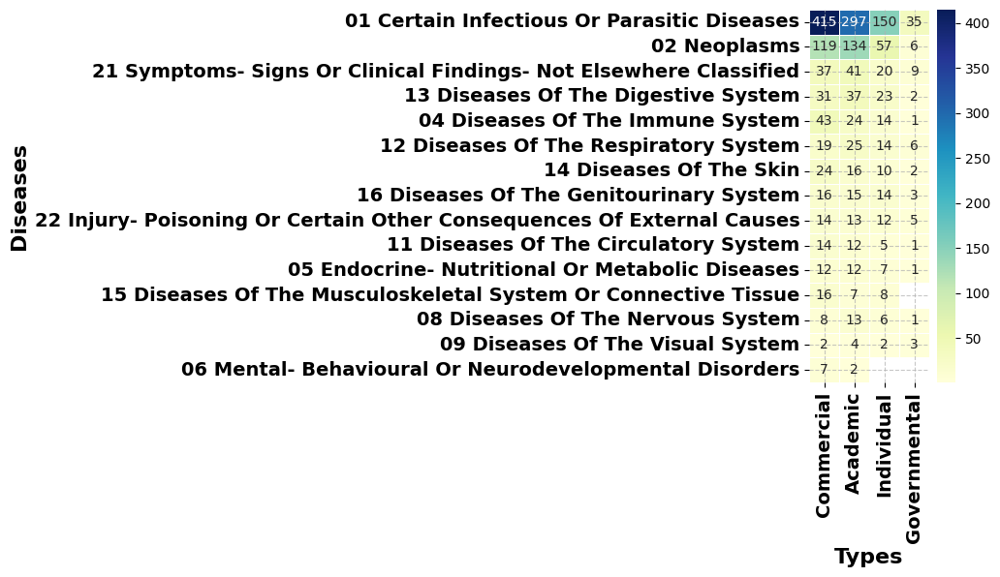

(15, 4)

In [200]:
index_cols = 'Applicants_categories'
split_col = 'Clean_Diseases'
top_n_col = 4
top_n_index = 15
figsize=(2, 5)
xlabel = "Types"
ylabel = "Diseases"

pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(pivot_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

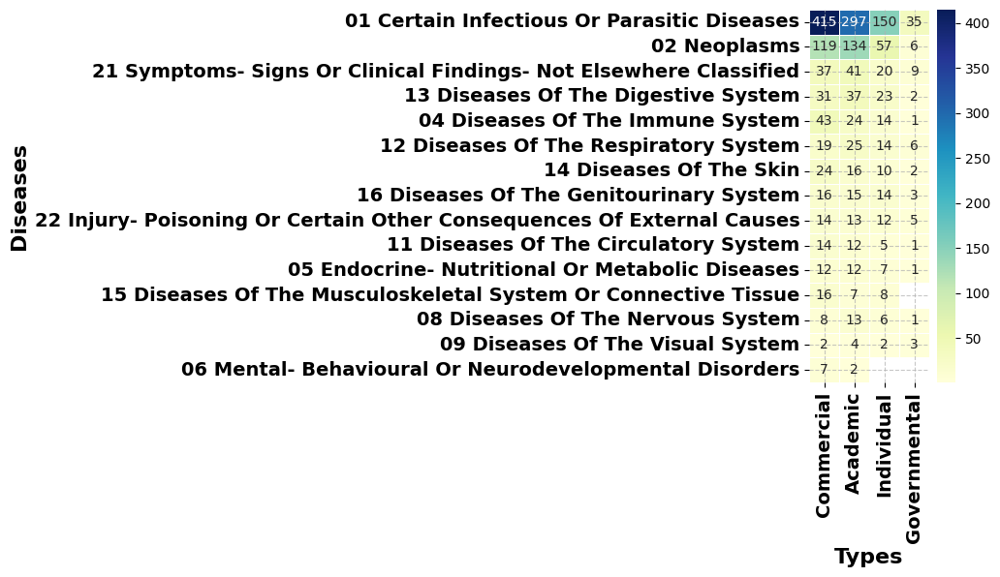

<Figure size 640x480 with 0 Axes>

In [201]:
fig = plot_top_50_heatmap(pivot_df, split_col, top_n_index, figsize, xlabel, ylabel)
plt.tight_layout(pad=10)
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4d.eps', format='eps', bbox_inches='tight')
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4d.png', format='png', bbox_inches='tight')

In [203]:
pivot_df

Applicants_categories,Commercial,Academic,Individual,Governmental
Clean_Diseases,,,,
01 Certain Infectious Or Parasitic Diseases,415.0,297.0,150.0,35.0
02 Neoplasms,119.0,134.0,57.0,6.0
21 Symptoms- Signs Or Clinical Findings- Not Elsewhere Classified,37.0,41.0,20.0,9.0
13 Diseases Of The Digestive System,31.0,37.0,23.0,2.0
04 Diseases Of The Immune System,43.0,24.0,14.0,1.0
12 Diseases Of The Respiratory System,19.0,25.0,14.0,6.0
14 Diseases Of The Skin,24.0,16.0,10.0,2.0
16 Diseases Of The Genitourinary System,16.0,15.0,14.0,3.0
22 Injury- Poisoning Or Certain Other Consequences Of External Causes,14.0,13.0,12.0,5.0


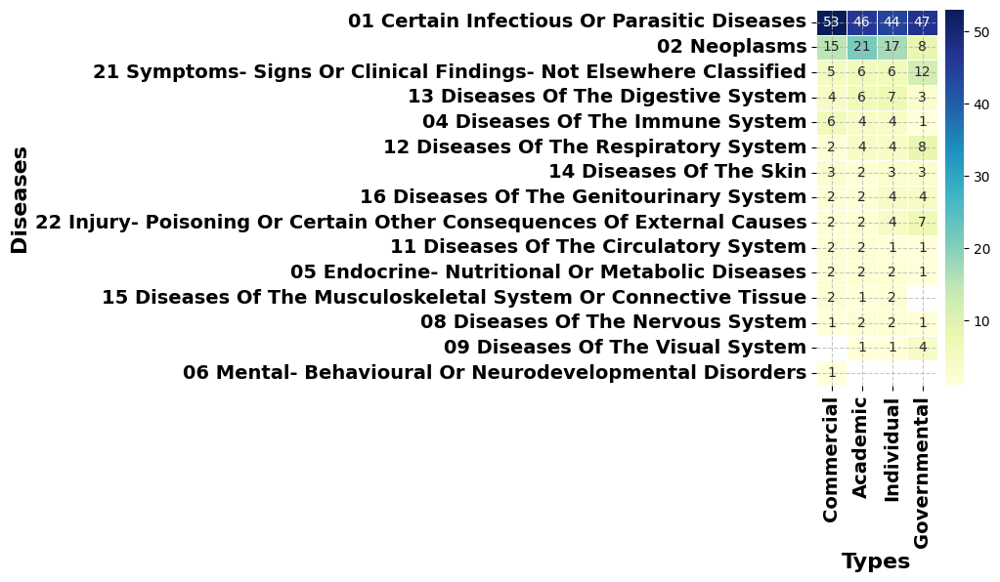

(15, 4)

In [204]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

Non-finite values before processing:
Applicants_categories
Commercial      0
Academic        0
Individual      1
Governmental    2
dtype: int64
Non-finite values after processing:
Applicants_categories
Commercial      0
Academic        0
Individual      0
Governmental    0
dtype: int64


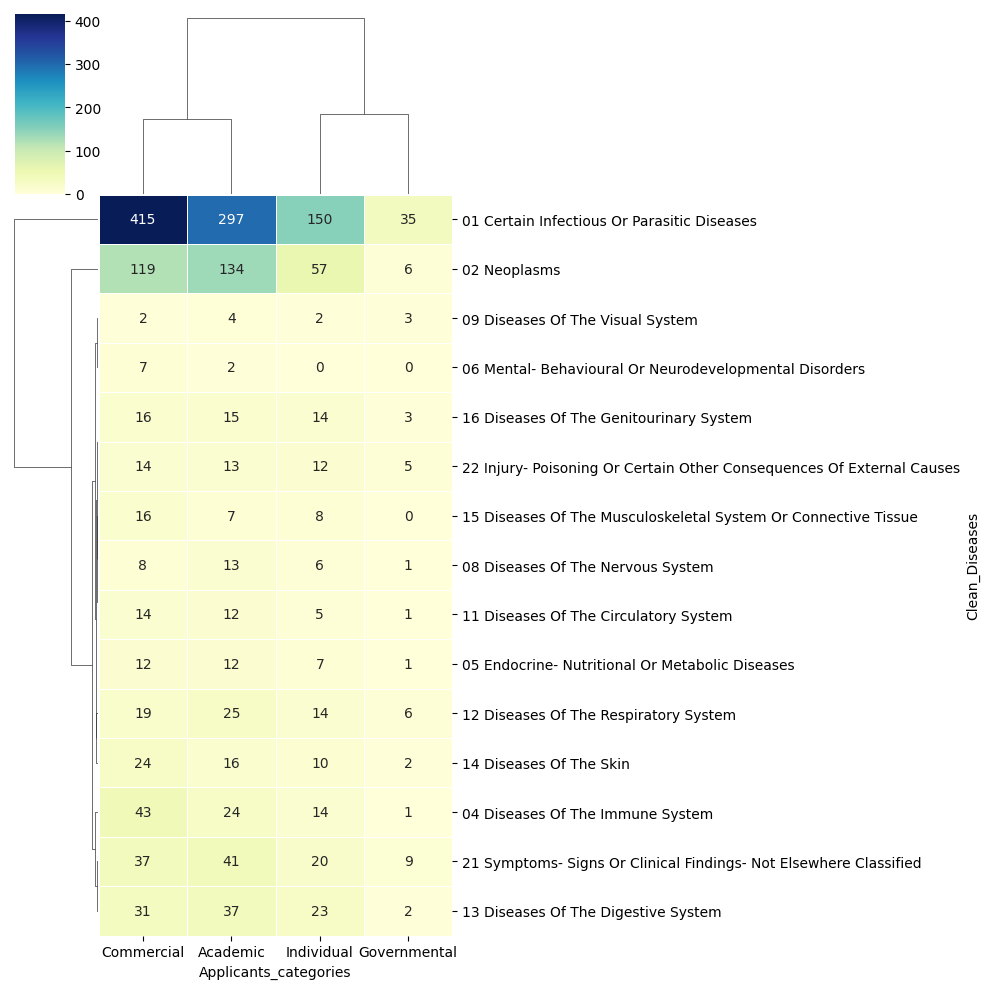

In [205]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming pivot_df is your DataFrame
#pivot_df = ...

# Identify non-finite values
print("Non-finite values before processing:")
print(pivot_df.isin([np.nan, np.inf, -np.inf]).sum())

# Handle non-finite values (e.g., replacing with zero)
pivot_df.replace([np.inf, -np.inf], np.nan, inplace=True)
pivot_df.fillna(0, inplace=True)

# Check again for non-finite values
print("Non-finite values after processing:")
print(pivot_df.isin([np.nan, np.inf, -np.inf]).sum())

# Create the heatmap with clustering
sns.clustermap(pivot_df, annot=True, fmt=".0f", cmap='YlGnBu', linewidths=.5)
plt.show()


Applicants_categories                               Commercial  Academic  \
Clean_Diseases                                                             
01 Certain Infectious Or Parasitic Diseases           1.324152  0.505017   
02 Neoplasms                                          0.783035  1.076674   
21 Symptoms- Signs Or Clinical Findings- Not El...    0.792724  1.102080   
13 Diseases Of The Digestive System                   0.585531  1.038846   
04 Diseases Of The Immune System                      1.466958  0.228193   

Applicants_categories                               Individual  Governmental  
Clean_Diseases                                                                
01 Certain Infectious Or Parasitic Diseases          -0.515430     -1.313739  
02 Neoplasms                                         -0.430669     -1.429039  
21 Symptoms- Signs Or Clinical Findings- Not El...   -0.522038     -1.372766  
13 Diseases Of The Digestive System                  -0.018888     -1.60

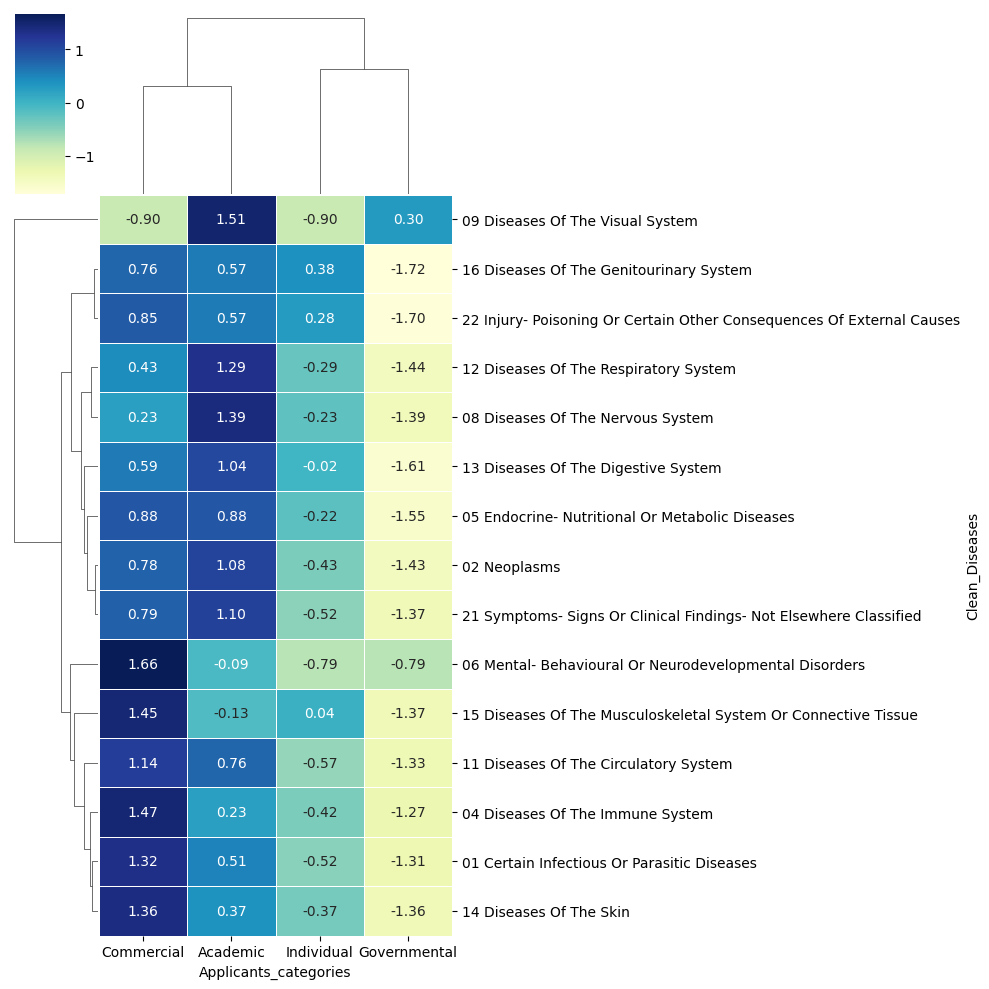

In [206]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Apply Z-score normalization
# Normalize rows (technologies)
normalized_df = pivot_df.apply(zscore, axis=1)

# Alternatively, to normalize columns (countries), use axis=0
# normalized_df = pivot_df.apply(zscore, axis=0)

# Check the normalized data
print(normalized_df.head())

# Create the heatmap with clustering
sns.clustermap(normalized_df, annot=True, fmt=".2f", cmap='YlGnBu', linewidths=.5)
plt.show()

##  Applicants region

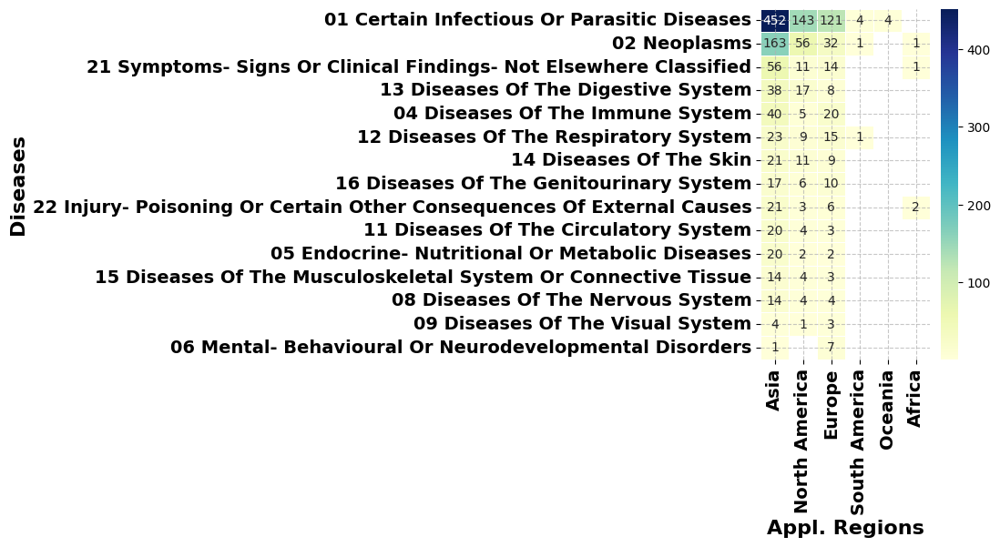

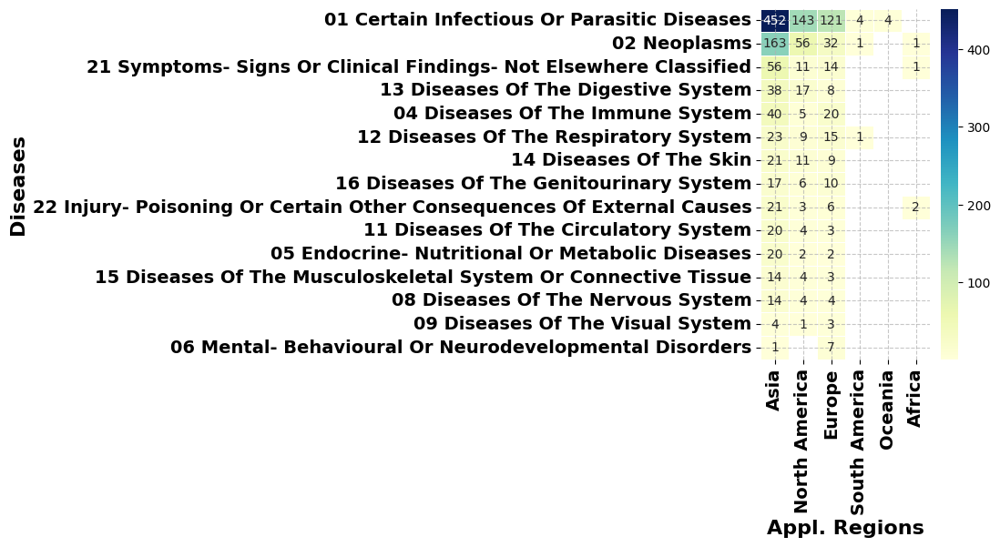

In [207]:
index_cols = 'Applicants_regions'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(3, 5)
xlabel = "Appl. Regions"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

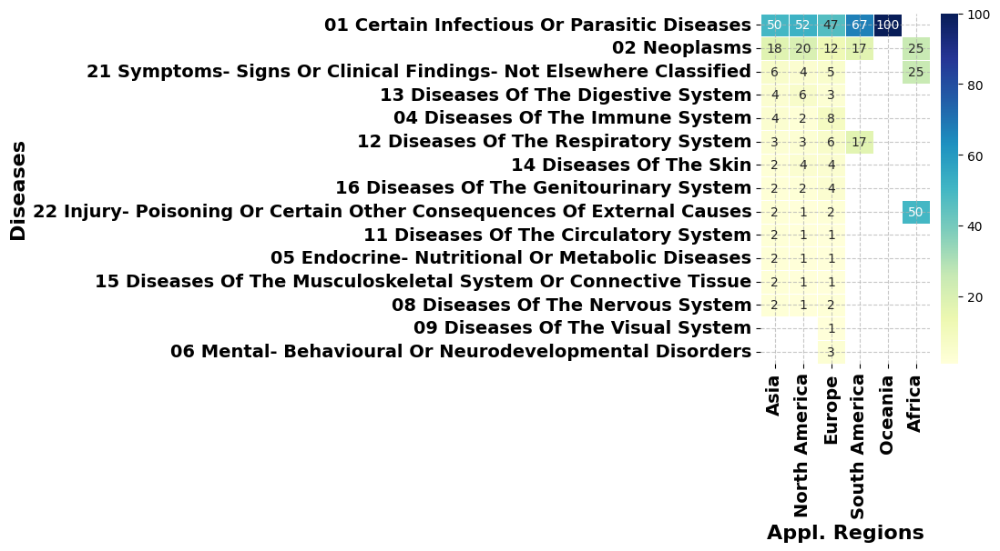

(15, 6)

In [208]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  Applicants countries

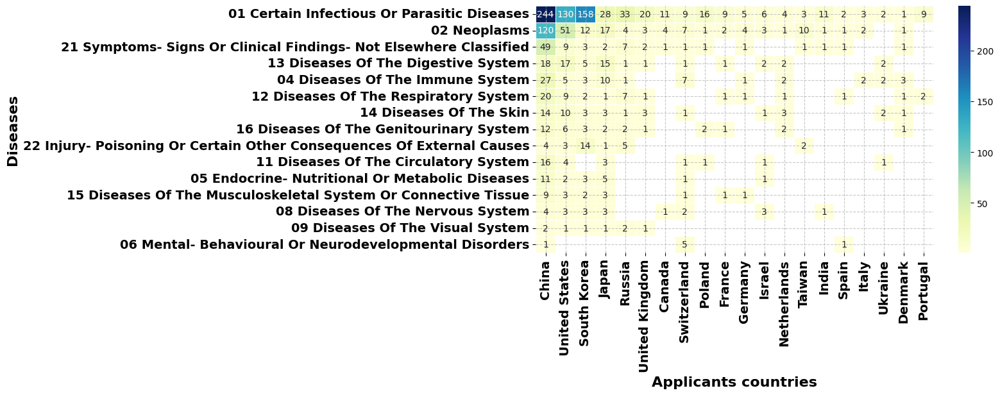

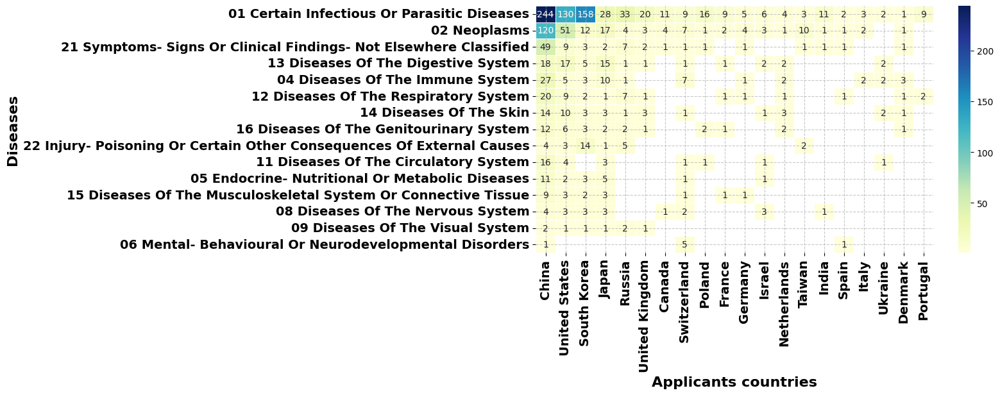

In [209]:
index_cols = 'Applicants_countries'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "Applicants countries"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

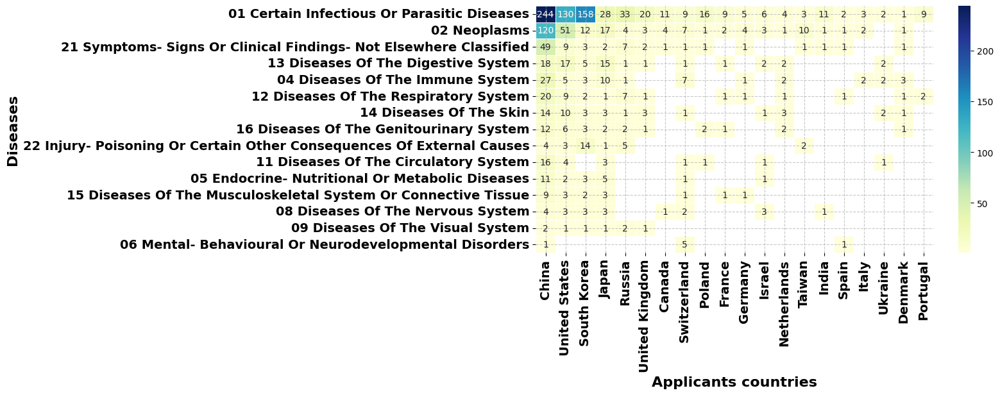

<Figure size 640x480 with 0 Axes>

In [210]:
fig = plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)
plt.tight_layout(pad=10)
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4b.eps', format='eps', bbox_inches='tight')
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4b.png', format='png')


In [211]:
df

Applicants_countries,China,United States,South Korea,Japan,Russia,United Kingdom,Canada,Switzerland,Poland,France,Germany,Israel,Netherlands,Taiwan,India,Spain,Italy,Ukraine,Denmark,Portugal
Clean_Diseases,,,,,,,,,,,,,,,,,,,,
01 Certain Infectious Or Parasitic Diseases,244.0,130.0,158.0,28.0,33.0,20.0,11.0,9.0,16.0,9.0,5.0,6.0,4.0,3.0,11.0,2.0,3.0,2.0,1.0,9.0
02 Neoplasms,120.0,51.0,12.0,17.0,4.0,3.0,4.0,7.0,1.0,2.0,4.0,3.0,1.0,10.0,1.0,1.0,2.0,NaN,1.0,NaN
21 Symptoms- Signs Or Clinical Findings- Not Elsewhere Classified,49.0,9.0,3.0,2.0,7.0,2.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN
13 Diseases Of The Digestive System,18.0,17.0,5.0,15.0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,2.0,2.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN
04 Diseases Of The Immune System,27.0,5.0,3.0,10.0,1.0,NaN,NaN,7.0,NaN,NaN,1.0,NaN,2.0,NaN,NaN,NaN,2.0,2.0,3.0,NaN
12 Diseases Of The Respiratory System,20.0,9.0,2.0,1.0,7.0,1.0,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN,1.0,NaN,NaN,1.0,2.0
14 Diseases Of The Skin,14.0,10.0,3.0,3.0,1.0,3.0,NaN,1.0,NaN,NaN,NaN,1.0,3.0,NaN,NaN,NaN,NaN,2.0,1.0,NaN
16 Diseases Of The Genitourinary System,12.0,6.0,3.0,2.0,2.0,1.0,NaN,NaN,2.0,1.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN
22 Injury- Poisoning Or Certain Other Consequences Of External Causes,4.0,3.0,14.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN


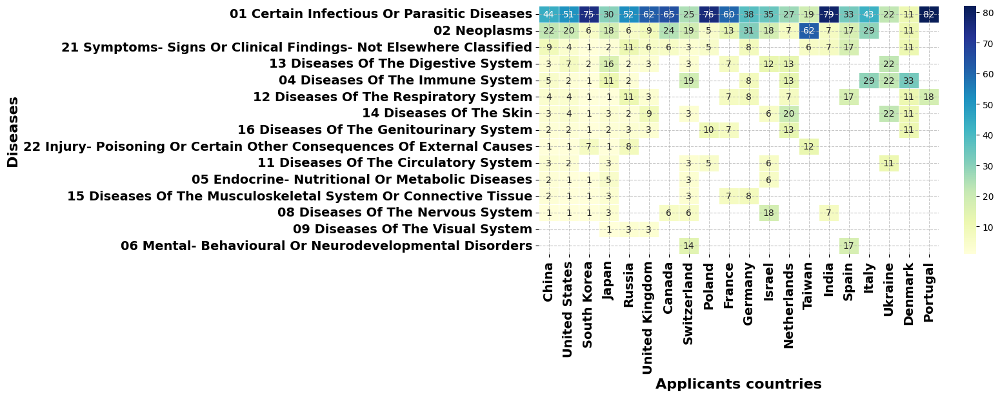

(15, 20)

In [212]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  Applicants

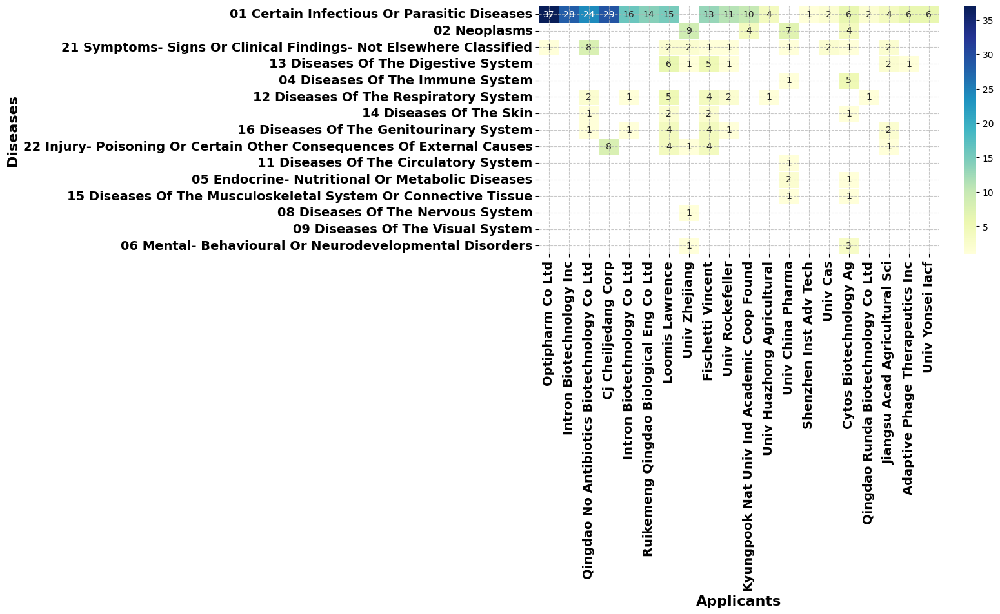

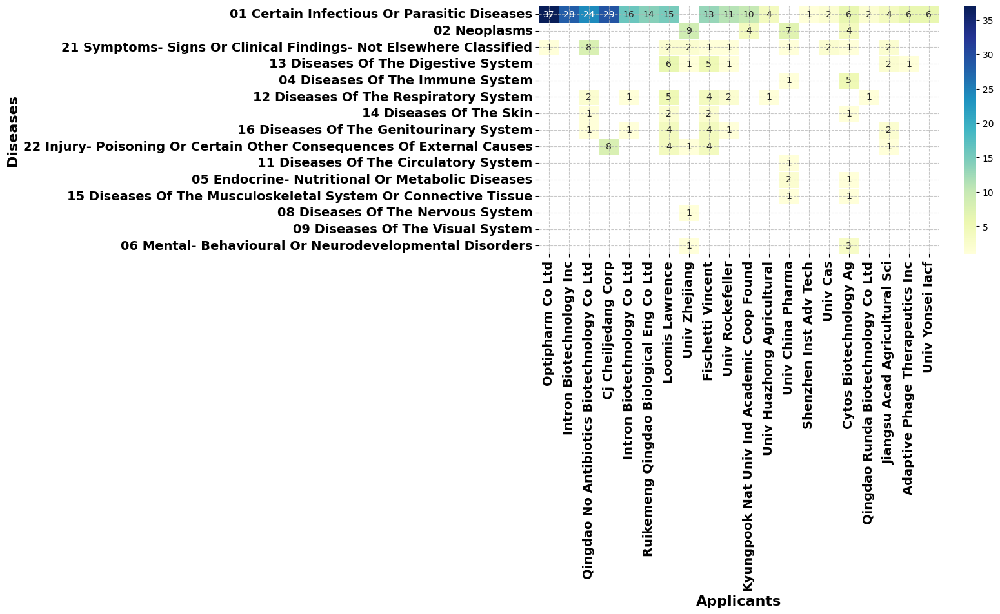

In [213]:
index_cols = 'Applicants'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "Applicants"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [214]:
df

Applicants,Optipharm Co Ltd,Intron Biotechnology Inc,Qingdao No Antibiotics Biotechnology Co Ltd,Cj Cheiljedang Corp,Intron Biotechnology Co Ltd,Ruikemeng Qingdao Biological Eng Co Ltd,Loomis Lawrence,Univ Zhejiang,Fischetti Vincent,Univ Rockefeller,Kyungpook Nat Univ Ind Academic Coop Found,Univ Huazhong Agricultural,Univ China Pharma,Shenzhen Inst Adv Tech,Univ Cas,Cytos Biotechnology Ag,Qingdao Runda Biotechnology Co Ltd,Jiangsu Acad Agricultural Sci,Adaptive Phage Therapeutics Inc,Univ Yonsei Iacf
Clean_Diseases,,,,,,,,,,,,,,,,,,,,
01 Certain Infectious Or Parasitic Diseases,37.0,28.0,24.0,29.0,16.0,14.0,15.0,NaN,13.0,11.0,10.0,4.0,NaN,1.0,2.0,6.0,2.0,4.0,6.0,6.0
02 Neoplasms,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,NaN,4.0,NaN,7.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN
21 Symptoms- Signs Or Clinical Findings- Not Elsewhere Classified,1.0,NaN,8.0,NaN,NaN,NaN,2.0,2.0,1.0,1.0,NaN,NaN,1.0,NaN,2.0,1.0,NaN,2.0,NaN,NaN
13 Diseases Of The Digestive System,NaN,NaN,NaN,NaN,NaN,NaN,6.0,1.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.0,NaN
04 Diseases Of The Immune System,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN
12 Diseases Of The Respiratory System,NaN,NaN,2.0,NaN,1.0,NaN,5.0,NaN,4.0,2.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
14 Diseases Of The Skin,NaN,NaN,1.0,NaN,NaN,NaN,2.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
16 Diseases Of The Genitourinary System,NaN,NaN,1.0,NaN,1.0,NaN,4.0,NaN,4.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN
22 Injury- Poisoning Or Certain Other Consequences Of External Causes,NaN,NaN,NaN,8.0,NaN,NaN,4.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


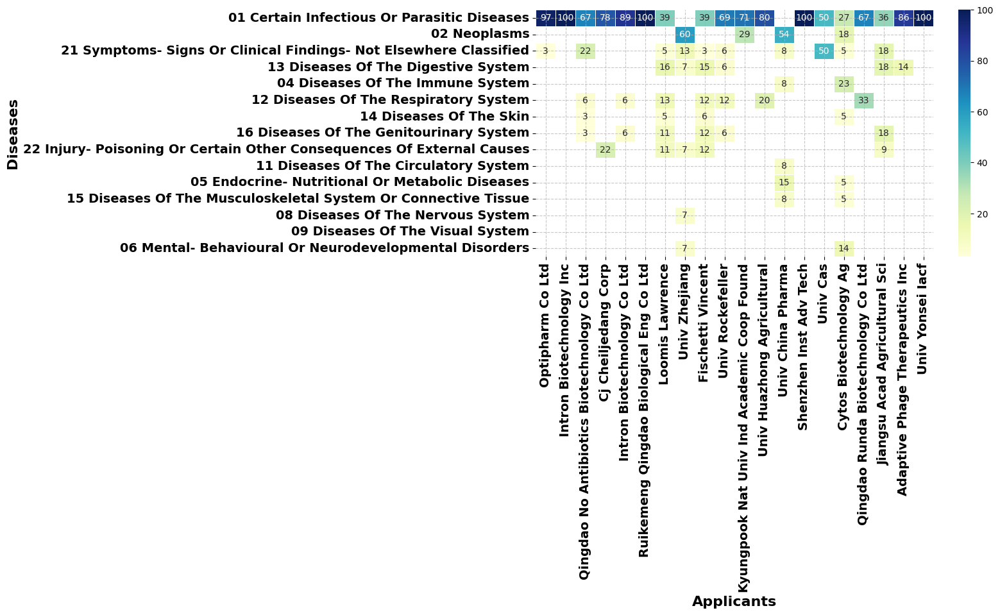

(15, 20)

In [215]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

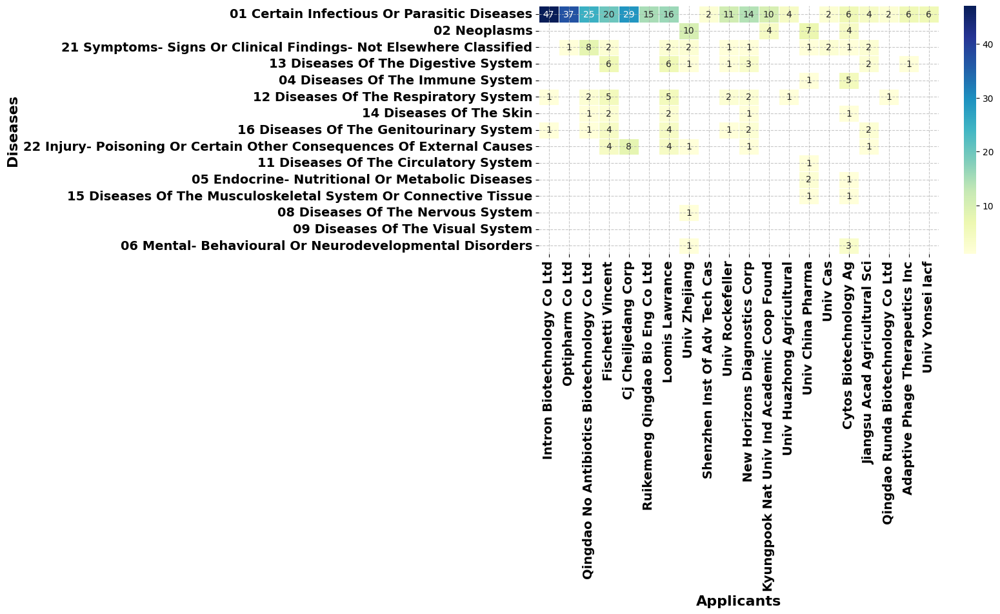

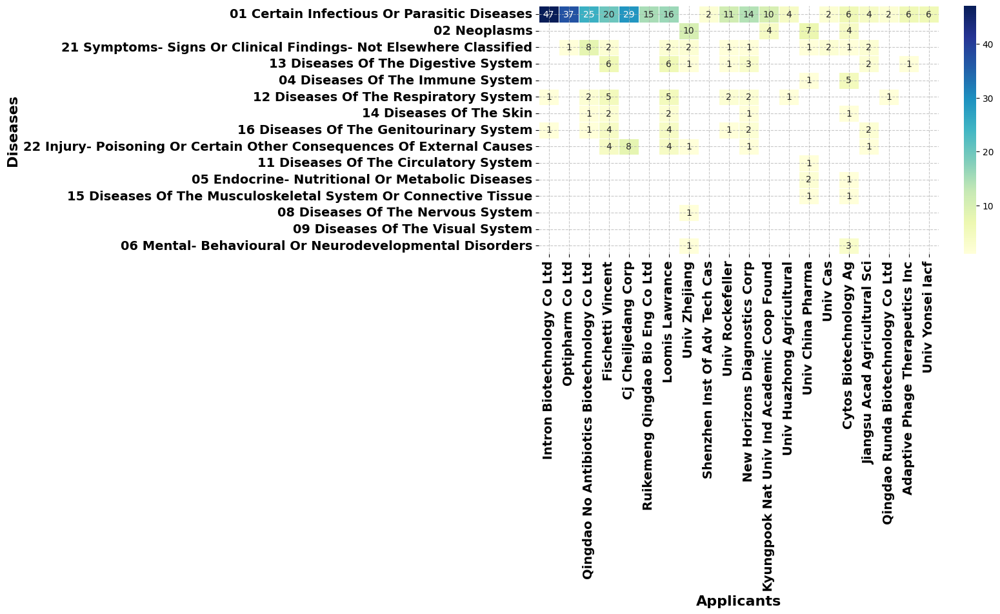

In [216]:
index_cols = 'Applicants_clean'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "Applicants"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

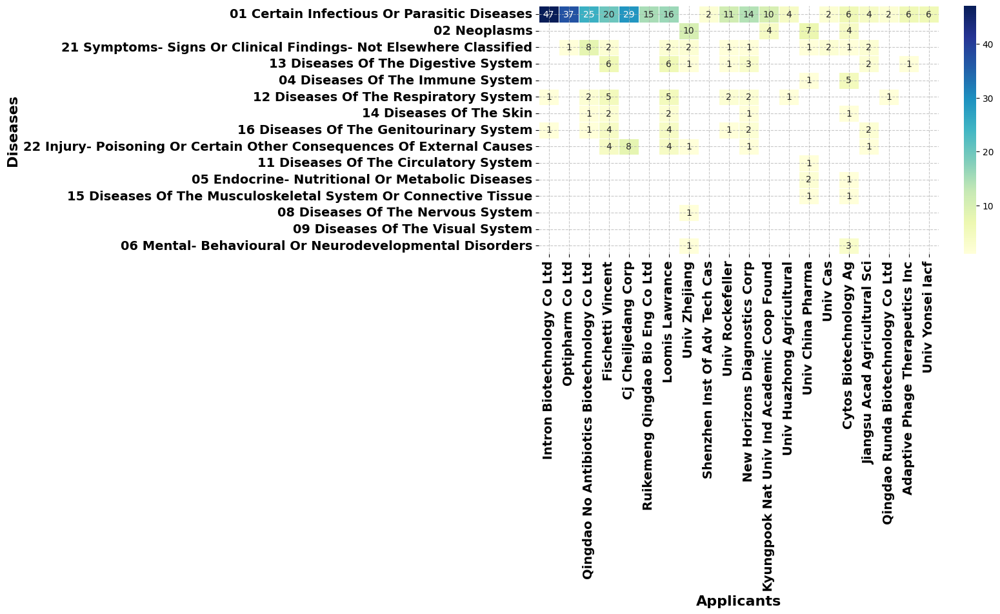

<Figure size 640x480 with 0 Axes>

In [217]:
fig = plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)
plt.tight_layout(pad=10)
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4c.eps', format='eps', bbox_inches='tight')
fig.savefig('/content/drive/Othercomputers/My laptop/D:/PROJECT/YORK UNIVERSITY/BACTERIOPHAGES/MANUSCRIPT/Phage Therapy manuscripts/download 16102024/to journal/to send/figure/FIG 4c.png', format='png')


In [218]:
df

Applicants_clean,Intron Biotechnology Co Ltd,Optipharm Co Ltd,Qingdao No Antibiotics Biotechnology Co Ltd,Fischetti Vincent,Cj Cheiljedang Corp,Ruikemeng Qingdao Bio Eng Co Ltd,Loomis Lawrance,Univ Zhejiang,Shenzhen Inst Of Adv Tech Cas,Univ Rockefeller,New Horizons Diagnostics Corp,Kyungpook Nat Univ Ind Academic Coop Found,Univ Huazhong Agricultural,Univ China Pharma,Univ Cas,Cytos Biotechnology Ag,Jiangsu Acad Agricultural Sci,Qingdao Runda Biotechnology Co Ltd,Adaptive Phage Therapeutics Inc,Univ Yonsei Iacf
Clean_Diseases,,,,,,,,,,,,,,,,,,,,
01 Certain Infectious Or Parasitic Diseases,47.0,37.0,25.0,20.0,29.0,15.0,16.0,NaN,2.0,11.0,14.0,10.0,4.0,NaN,2.0,6.0,4.0,2.0,6.0,6.0
02 Neoplasms,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,4.0,NaN,7.0,NaN,4.0,NaN,NaN,NaN,NaN
21 Symptoms- Signs Or Clinical Findings- Not Elsewhere Classified,NaN,1.0,8.0,2.0,NaN,NaN,2.0,2.0,NaN,1.0,1.0,NaN,NaN,1.0,2.0,1.0,2.0,NaN,NaN,NaN
13 Diseases Of The Digestive System,NaN,NaN,NaN,6.0,NaN,NaN,6.0,1.0,NaN,1.0,3.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,1.0,NaN
04 Diseases Of The Immune System,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,5.0,NaN,NaN,NaN,NaN
12 Diseases Of The Respiratory System,1.0,NaN,2.0,5.0,NaN,NaN,5.0,NaN,NaN,2.0,2.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN
14 Diseases Of The Skin,NaN,NaN,1.0,2.0,NaN,NaN,2.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
16 Diseases Of The Genitourinary System,1.0,NaN,1.0,4.0,NaN,NaN,4.0,NaN,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN
22 Injury- Poisoning Or Certain Other Consequences Of External Causes,NaN,NaN,NaN,4.0,8.0,NaN,4.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


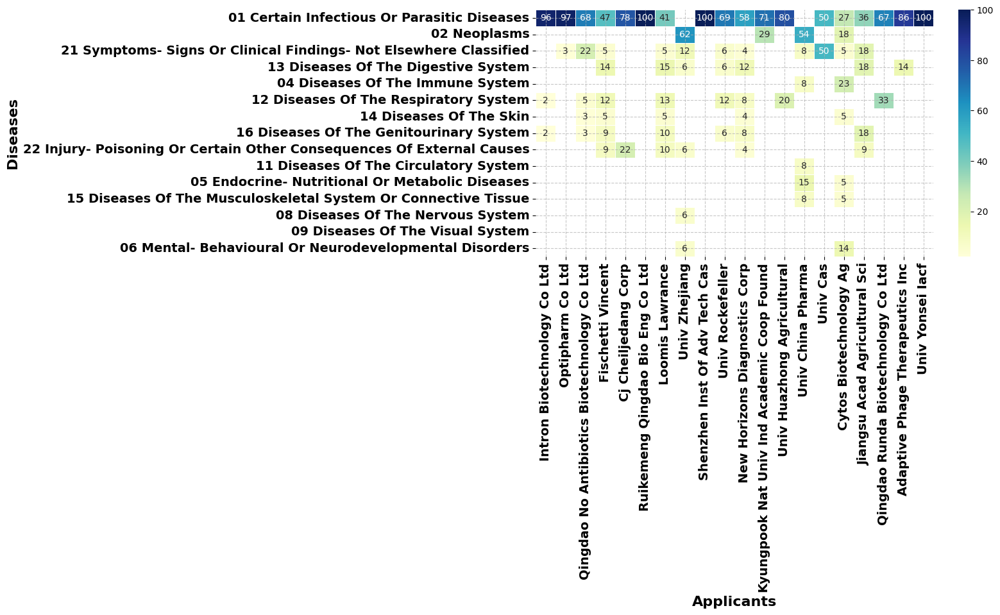

(15, 20)

In [219]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  Inventors

In [ ]:
index_cols = 'Inventors'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "Inventors"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

In [ ]:
index_cols = 'Inventors_clean'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "Inventors"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

## topics

In [ ]:
index_cols = 'Topic N°'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(4, 5)
xlabel = "Topics"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  IPCR Sections

In [ ]:
index_cols = 'IPCR Sections'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(4, 5)
xlabel = "IPCR Sections"
ylabel = "Diseases"

pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(pivot_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  IPCR Subclass

In [ ]:
index_cols = 'IPCR Subclass'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "IPCR Subclass"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  IPCR Class

In [ ]:
index_cols = 'IPCR Class'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(9, 5)
xlabel = "IPCR Class"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  IPCR Classifications

In [ ]:
index_cols = 'IPCR Classifications'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "IPCR Classifications"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  CPC Classifications

In [ ]:
index_cols = 'CPC Classifications'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "CPC Classifications"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

## Applicants_Last_Classification

In [ ]:
index_cols = 'Applicants_Last_Classification'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(2, 5)
xlabel = "Appl. Engage."
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  Inventors_Last_Classification

In [ ]:
index_cols = 'Inventors_Last_Classification'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(2, 5)
xlabel = "Inv. Engage."
ylabel = "Diseases"

pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(pivot_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  Jurisdiction Country

In [ ]:
index_cols = 'Jurisdiction_name'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(10, 5)
xlabel = "Jurisdiction"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape

##  Jurisdiction Region

In [ ]:
index_cols = 'Jurisdiction_Region'
split_col = 'Clean_Diseases'
top_n_col = 20
top_n_index = 15
figsize=(3, 5)
xlabel = "Jurisd. regions"
ylabel = "Diseases"

df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
plot_top_50_heatmap(df, split_col, top_n_index,  figsize, xlabel, ylabel)

In [ ]:
pivot_df = process_data(data, index_cols, split_col, top_n_index, top_n_col)
# Percentage Normalization - Normalize each row (technology) to sum to 100
percentage_normalized_df = pivot_df.div(pivot_df.sum(axis=0), axis=1) * 100

plot_top_50_heatmap(percentage_normalized_df, split_col, top_n_index,  figsize, xlabel, ylabel)
pivot_df.shape